In [1]:
# 기본
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 경고 뜨지 않게 설정
import warnings
warnings.filterwarnings('ignore')

# 그래프 설정
sns.set()

# 그래프 기본 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
# 평가함수
# 분류용
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

# 회귀용
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

# 모델의 최적의 하이퍼 파라미터를 찾기 위한 도구
from sklearn.model_selection import GridSearchCV

# 머신러닝 알고리즘 - 분류
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier

# 머신러닝 알고리즘 - 회귀
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import VotingRegressor

# 학습 모델 저장을 위한 라이브러리
import pickle

In [2]:
train_df = pd.read_csv('data/잔액정보_with_segment.csv')

In [3]:
subset = train_df[train_df['기준년월'] == 201811]

In [4]:
from sklearn.impute import SimpleImputer

# 숫자형 변수만 추출
numeric_data = subset.select_dtypes(include='number')

# 평균값으로 결측치 채우기
imputer = SimpleImputer(strategy='mean')
filled_data = imputer.fit_transform(numeric_data)

# PCA 수행
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
scaled = StandardScaler().fit_transform(filled_data)
pca = PCA(n_components=2)
components = pca.fit_transform(scaled)

# 결과 저장
pca_df = pd.DataFrame(components, columns=['PC1', 'PC2'], index=subset.index)
pca_df['Segment'] = subset['Segment'].values


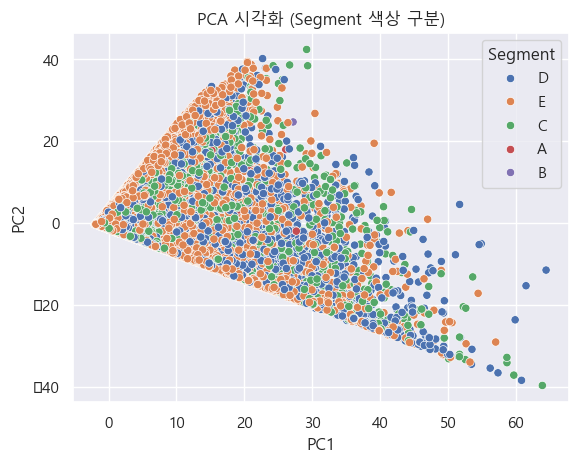

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Segment')
plt.title('PCA 시각화 (Segment 색상 구분)')
plt.show()


In [6]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. 수치형 변수 선택 및 정규화
numeric_data = subset.select_dtypes(include='number')
imputed_data = numeric_data.fillna(numeric_data.mean())  # 결측값 처리
scaled_data = StandardScaler().fit_transform(imputed_data)

# 2. PCA 수행
pca = PCA(n_components=2)
pca.fit(scaled_data)

# 3. 구성 성분 확인
loadings = pd.DataFrame(
    pca.components_.T,  # 전치행렬: 변수 x 주성분
    columns=['PC1', 'PC2'],
    index=numeric_data.columns
)

# 4. 절대값 기준으로 가장 영향력 있는 변수 확인
top_pc1 = loadings['PC1'].abs().sort_values(ascending=False)
top_pc2 = loadings['PC2'].abs().sort_values(ascending=False)

print("📌 PC1에 가장 영향을 준 변수:")
print(top_pc1.head(10))
print("\n📌 PC2에 가장 영향을 준 변수:")
print(top_pc2.head(10))


📌 PC1에 가장 영향을 준 변수:
월중평잔_RV일시불         0.211616
평잔_RV일시불_3M        0.208875
평잔_RV일시불_6M        0.207582
RV_최대잔액_R12M       0.206189
RV_최대잔액_R6M        0.205371
RV_평균잔액_R3M        0.205148
RV_최대잔액_R3M        0.205060
RV_평균잔액_R6M        0.204290
잔액_리볼빙일시불이월_B0M    0.201919
RV_평균잔액_R12M       0.197709
Name: PC1, dtype: float64

📌 PC2에 가장 영향을 준 변수:
월중평잔_카드론      0.230525
잔액_카드론_B1M    0.230463
잔액_카드론_B0M    0.230237
잔액_카드론_B2M    0.230062
잔액_카드론_B3M    0.229657
잔액_카드론_B5M    0.229250
잔액_카드론_B4M    0.228824
평잔_카드론_3M     0.227615
평잔_카드론_6M     0.227490
평잔_3M         0.180599
Name: PC2, dtype: float64


In [7]:
subset[subset['Segment'].isin(['A', 'B'])].isna().mean().sort_values(ascending=False).head(10)

연체일자_B0M          1.0
기준년월              0.0
연체잔액_할부_해외_B0M    0.0
월중평잔_CA           0.0
월중평잔_할부           0.0
월중평잔_RV일시불        0.0
월중평잔_일시불          0.0
월중평잔              0.0
연체잔액_CA_해외_B0M    0.0
연체잔액_CA_B0M       0.0
dtype: float64

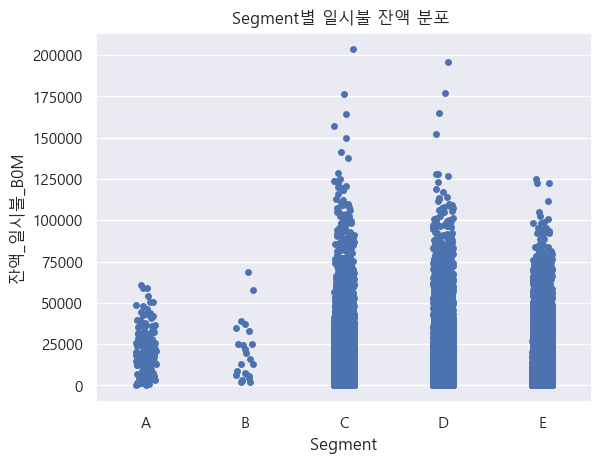

In [8]:
# Segment 순서를 수동 지정
ordered_segments = ['A', 'B', 'C', 'D', 'E']

sns.stripplot(x='Segment', y='잔액_일시불_B0M', data=subset, jitter=True, order=ordered_segments)
plt.title('Segment별 일시불 잔액 분포 ')
plt.show()

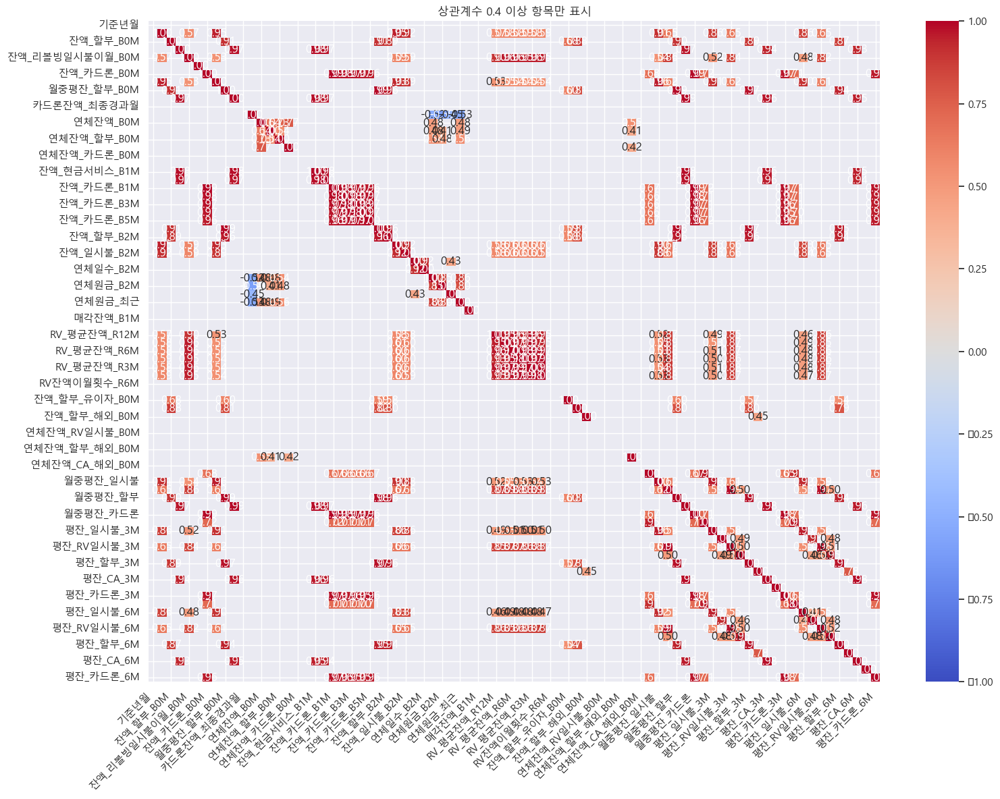

In [9]:
# 상관계수 계산
corr = subset.corr(numeric_only=True)

# 절대값 기준 필터링 (예: 0.5 이상만)
filtered_corr = corr.copy()
filtered_corr[np.abs(filtered_corr) < 0.4] = np.nan

plt.figure(figsize=(16, 12))
sns.heatmap(filtered_corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, mask=filtered_corr.isnull())
plt.title('상관계수 0.4 이상 항목만 표시')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [10]:
import pandas as pd
import numpy as np

# 상관계수 계산
corr = subset.corr(numeric_only=True)

# 상삼각 (자기 자신 제외)
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
filtered = corr.where(mask)

# 절대값 기준 필터링
result = (
    filtered.stack()
    .reset_index()
    .rename(columns={'level_0': '변수1', 'level_1': '변수2', 0: '상관계수'})
)

# 상관계수 0.4 이상만 추출
result = result[result['상관계수'].abs() >= 0.98]
result = result.sort_values(by='상관계수', ascending=False)

# 결과 출력
print(result)


               변수1           변수2      상관계수
976     잔액_카드론_B1M      월중평잔_카드론  0.993106
334     잔액_카드론_B0M    잔액_카드론_B1M  0.992867
365     잔액_카드론_B0M      월중평잔_카드론  0.990000
1712   RV_평균잔액_R6M   RV_평균잔액_R3M  0.989710
460    월중평잔_할부_B0M     잔액_할부_B1M  0.989268
484    월중평잔_할부_B0M       월중평잔_할부  0.989079
2002    월중평잔_RV일시불   평잔_RV일시불_3M  0.987504
544    월중평잔_CA_B0M       월중평잔_CA  0.987140
1745   RV_최대잔액_R6M   RV_최대잔액_R3M  0.985400
144   잔액_현금서비스_B0M  잔액_현금서비스_B1M  0.984036
1214     잔액_할부_B1M       월중평잔_할부  0.983155
872   잔액_현금서비스_B1M       월중평잔_CA  0.982793
1047    잔액_카드론_B3M    잔액_카드론_B4M  0.982311
997     잔액_카드론_B2M    잔액_카드론_B3M  0.981139
1711   RV_평균잔액_R6M   RV_최대잔액_R6M  0.980513
1026    잔액_카드론_B2M      월중평잔_카드론  0.980316


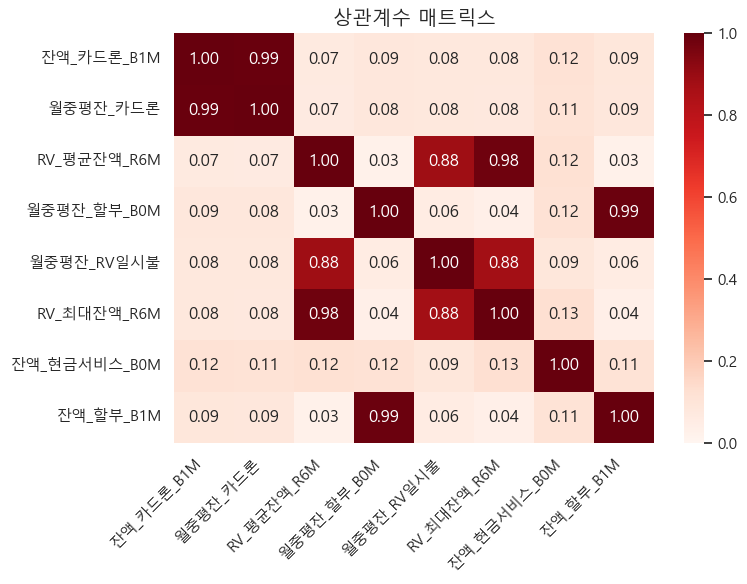

In [11]:
# 원하는 변수 리스트
cols = [
    '잔액_카드론_B1M',
    '월중평잔_카드론',
    'RV_평균잔액_R6M',
    '월중평잔_할부_B0M',
    '월중평잔_RV일시불',
    'RV_최대잔액_R6M',
    '잔액_현금서비스_B0M',
    '잔액_할부_B1M'
]

# 숫자형 컬럼만 필터링되어 있어야 함
corr = subset[cols].corr()

# 히트맵 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='Reds', vmin=0, vmax=1)
plt.title('상관계수 매트릭스', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [12]:
import numpy as np

# 상관계수 계산
corr = subset.corr(numeric_only=True)

# 상삼각 행렬 (자기 자신 제외)
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
upper = corr.where(mask)

# 0.8 이상인 항목 필터링
high_corr = upper[abs(upper) >= 0.98]

# 컬럼 이름 추출 (중복 없이)
cols = set(high_corr.dropna(how='all').index) | set(high_corr.dropna(axis=1, how='all').columns)
selected_columns = sorted(cols)

# 출력
print("상관계수 0.98 이상인 컬럼 목록:")
for col in selected_columns:
    print(col)


상관계수 0.98 이상인 컬럼 목록:
RV_최대잔액_R3M
RV_최대잔액_R6M
RV_평균잔액_R3M
RV_평균잔액_R6M
월중평잔_CA
월중평잔_CA_B0M
월중평잔_RV일시불
월중평잔_카드론
월중평잔_할부
월중평잔_할부_B0M
잔액_카드론_B0M
잔액_카드론_B1M
잔액_카드론_B2M
잔액_카드론_B3M
잔액_카드론_B4M
잔액_할부_B1M
잔액_현금서비스_B0M
잔액_현금서비스_B1M
평잔_RV일시불_3M


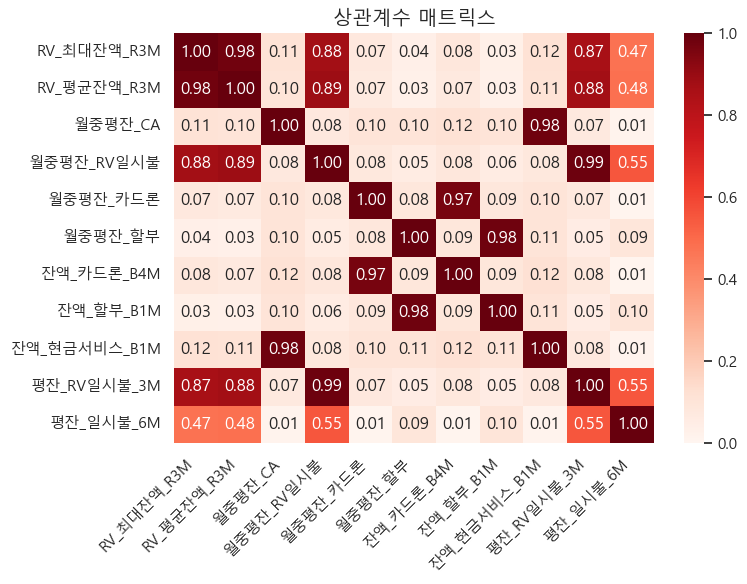

In [13]:
# 원하는 변수 리스트
cols = [
    'RV_최대잔액_R3M',
    'RV_평균잔액_R3M',
    '월중평잔_CA',
    '월중평잔_RV일시불',
    '월중평잔_카드론',
    '월중평잔_할부',
    '잔액_카드론_B4M',
    '잔액_할부_B1M',
    '잔액_현금서비스_B1M',
    '평잔_RV일시불_3M',
    '평잔_일시불_6M'
]

# 숫자형 컬럼만 필터링되어 있어야 함
corr = subset[cols].corr()

# 히트맵 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='Reds', vmin=0, vmax=1)
plt.title('상관계수 매트릭스', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


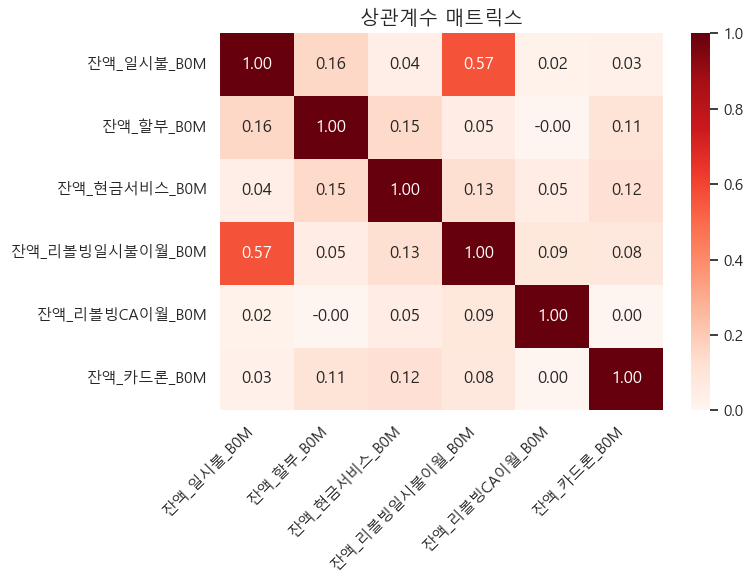

In [9]:
# 원하는 변수 리스트
cols = [
    '잔액_일시불_B0M',
    '잔액_할부_B0M',
    '잔액_현금서비스_B0M',
    '잔액_리볼빙일시불이월_B0M',
    '잔액_리볼빙CA이월_B0M',
    '잔액_카드론_B0M'
]

# 숫자형 컬럼만 필터링되어 있어야 함
corr = subset[cols].corr()

# 히트맵 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='Reds', vmin=0, vmax=1)
plt.title('상관계수 매트릭스', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


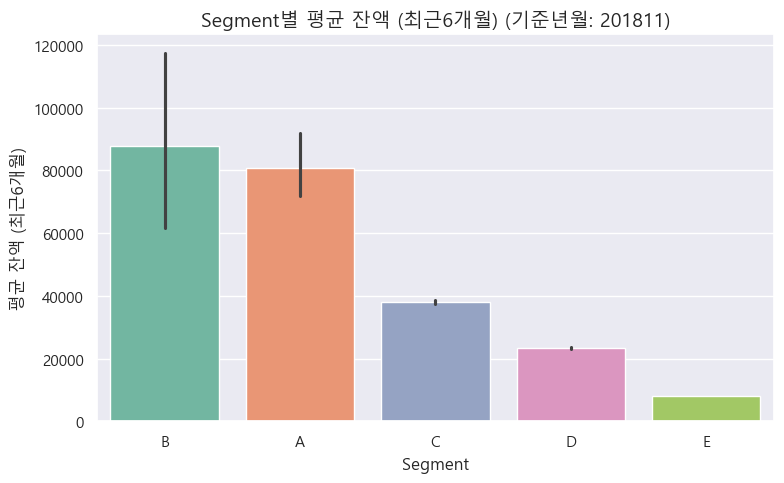

In [7]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['평잔_6M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='평잔_6M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 평균 잔액 (최근6개월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('평균 잔액 (최근6개월)', fontsize=12)

plt.tight_layout()
plt.show()


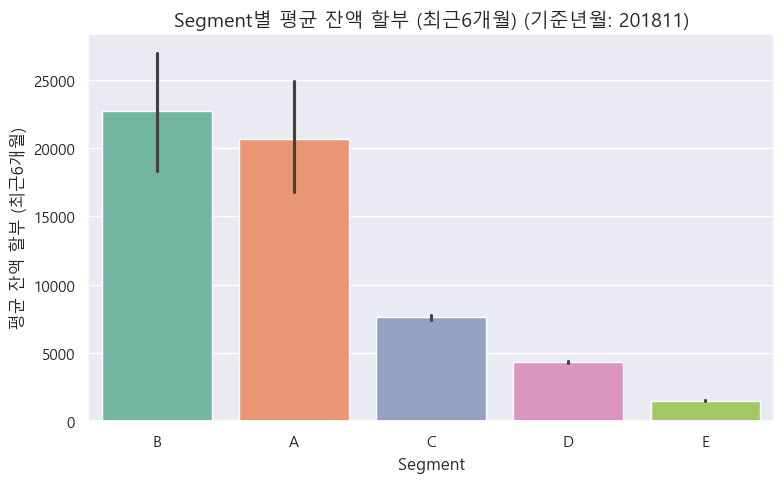

In [9]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['평잔_할부_6M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='평잔_할부_6M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 평균 잔액 할부 (최근6개월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('평균 잔액 할부 (최근6개월)', fontsize=12)

plt.tight_layout()
plt.show()


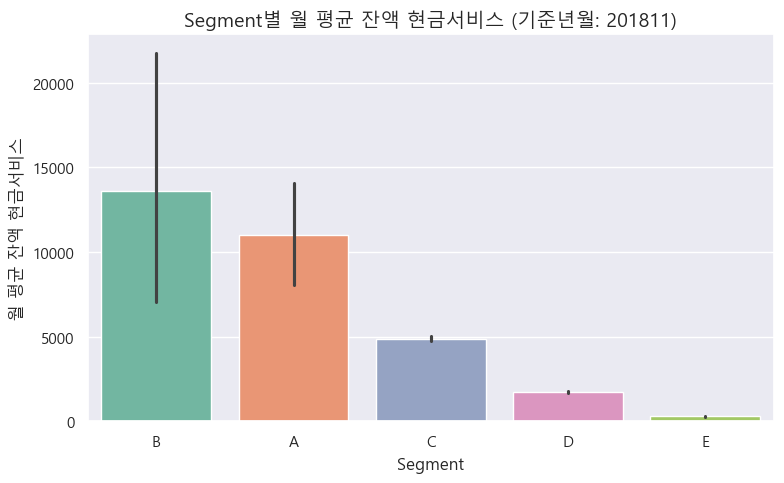

In [17]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['월중평잔_CA']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='월중평잔_CA',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 월 평균 잔액 현금서비스 (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('월 평균 잔액 현금서비스', fontsize=12)

plt.tight_layout()
plt.show()


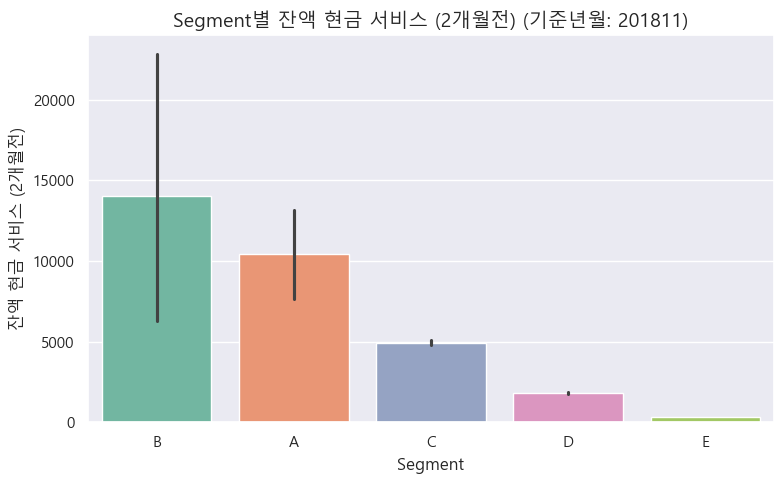

In [19]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['잔액_현금서비스_B2M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='잔액_현금서비스_B2M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 잔액 현금 서비스 (2개월전) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('잔액 현금 서비스 (2개월전)', fontsize=12)

plt.tight_layout()
plt.show()


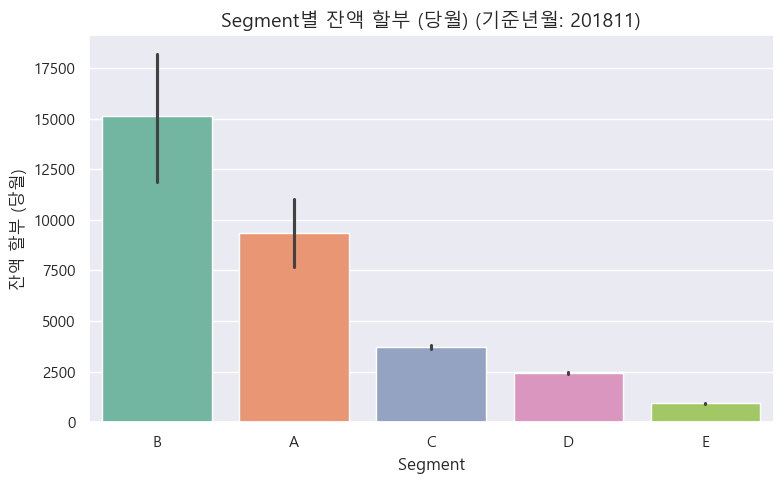

In [21]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['잔액_할부_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='잔액_할부_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 잔액 할부 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('잔액 할부 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


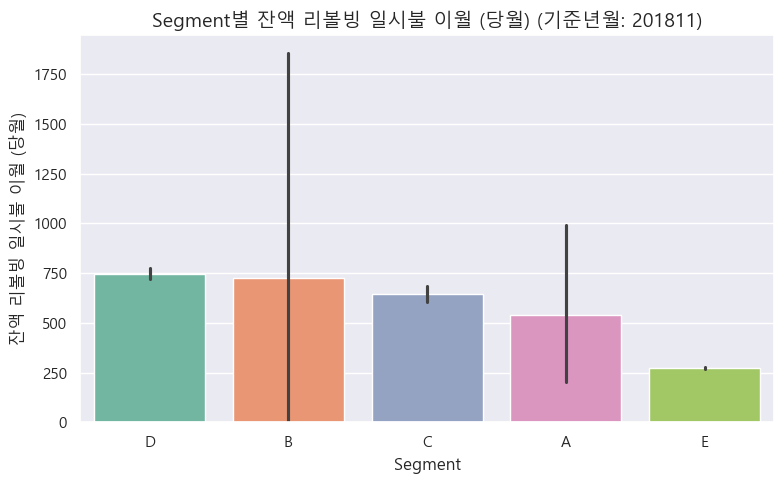

In [23]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['잔액_리볼빙일시불이월_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='잔액_리볼빙일시불이월_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 잔액 리볼빙 일시불 이월 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('잔액 리볼빙 일시불 이월 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


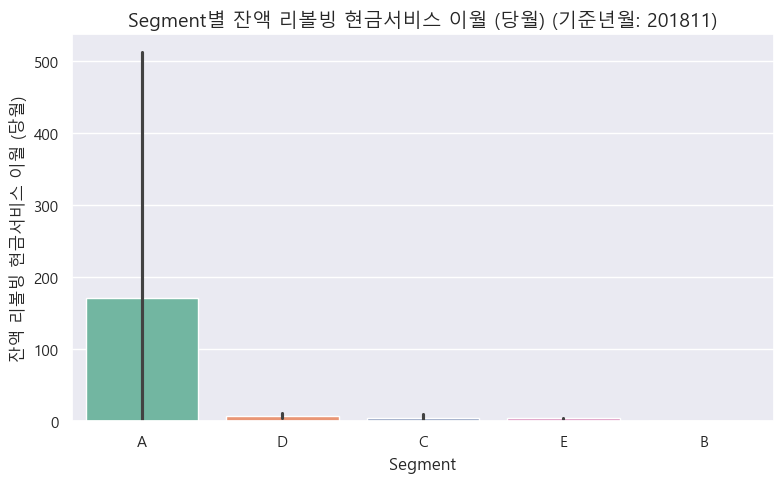

In [25]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['잔액_리볼빙CA이월_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='잔액_리볼빙CA이월_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 잔액 리볼빙 현금서비스 이월 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('잔액 리볼빙 현금서비스 이월 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


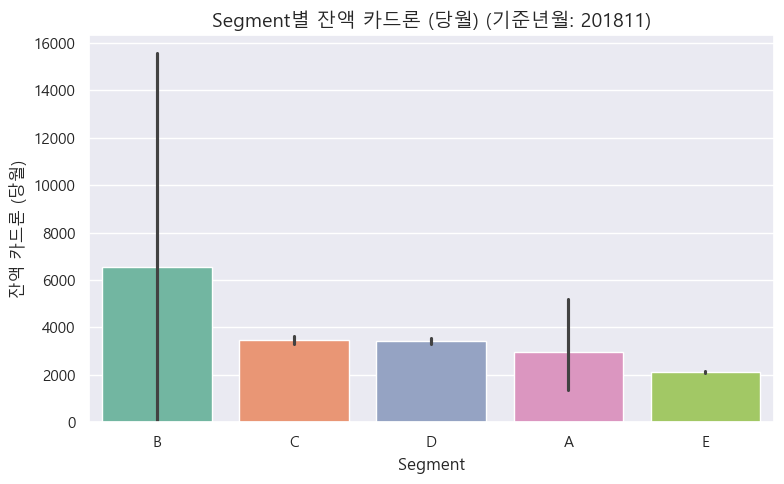

In [27]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['잔액_카드론_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='잔액_카드론_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 잔액 카드론 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('잔액 카드론 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


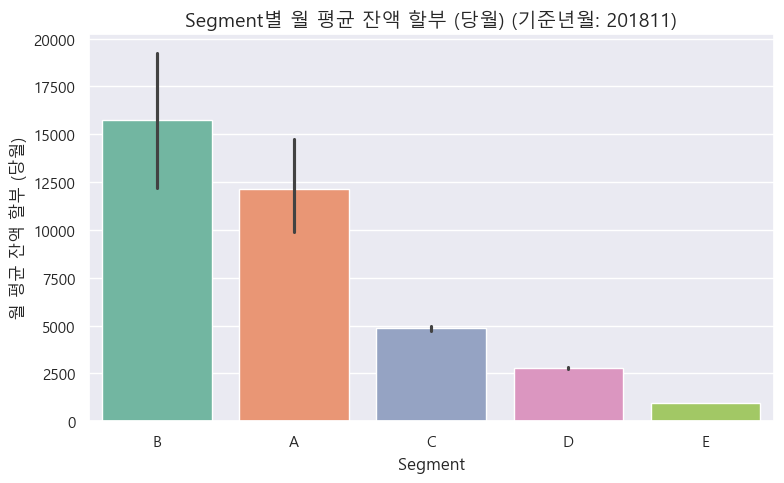

In [29]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['월중평잔_할부_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='월중평잔_할부_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 월 평균 잔액 할부 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('월 평균 잔액 할부 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


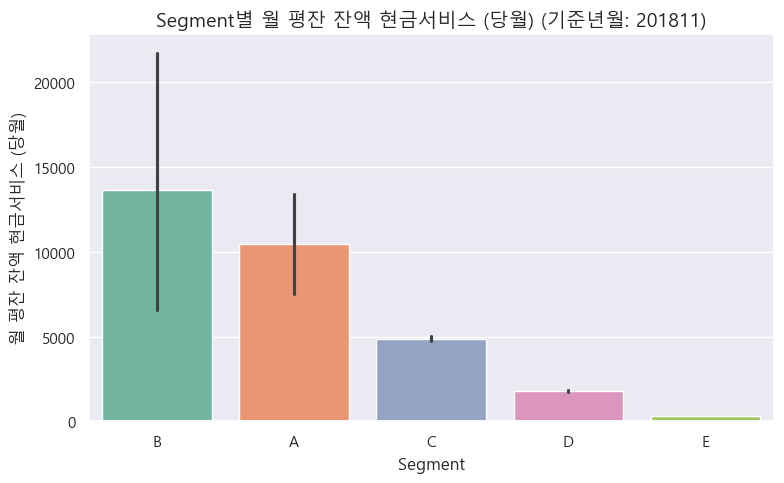

In [31]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['월중평잔_CA_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='월중평잔_CA_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 월 평잔 잔액 현금서비스 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('월 평잔 잔액 현금서비스 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


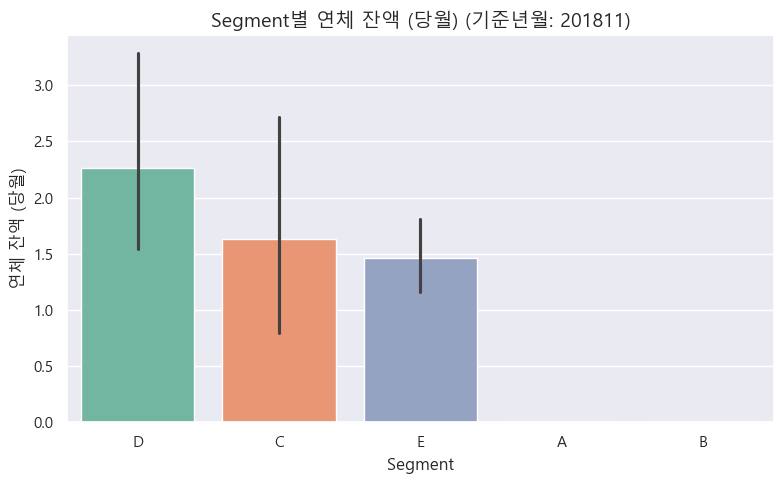

In [33]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['연체잔액_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='연체잔액_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 연체 잔액 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('연체 잔액 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


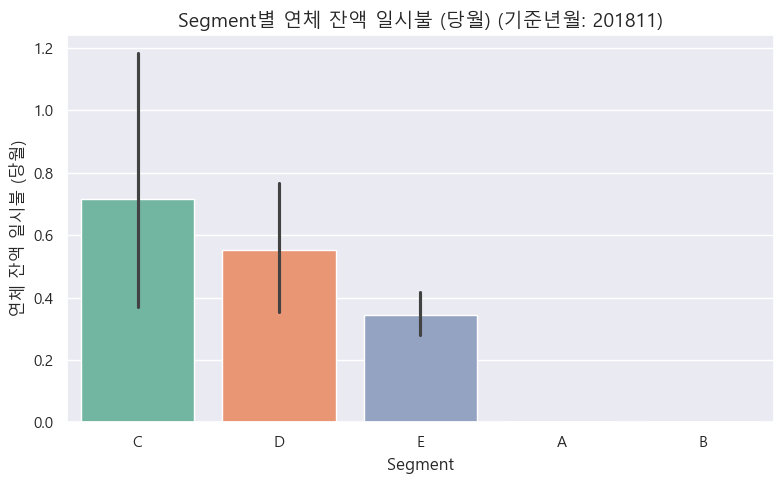

In [57]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['연체잔액_일시불_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='연체잔액_일시불_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 연체 잔액 일시불 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('연체 잔액 일시불 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


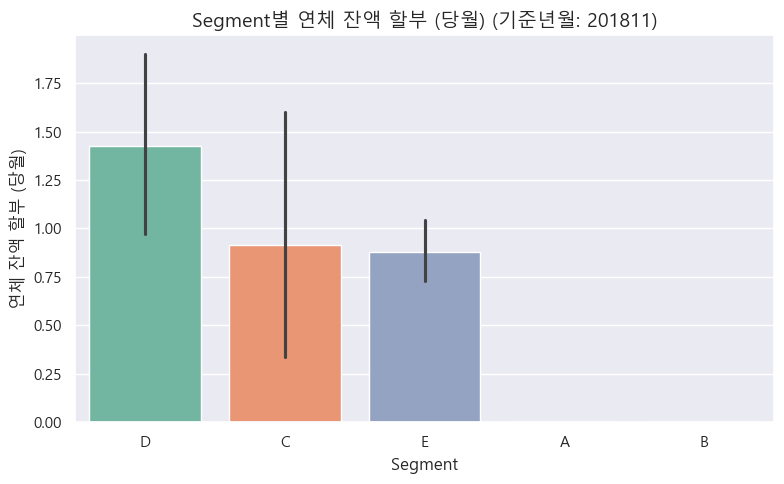

In [59]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['연체잔액_할부_B0M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='연체잔액_할부_B0M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 연체 잔액 할부 (당월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('연체 잔액 할부 (당월)', fontsize=12)

plt.tight_layout()
plt.show()


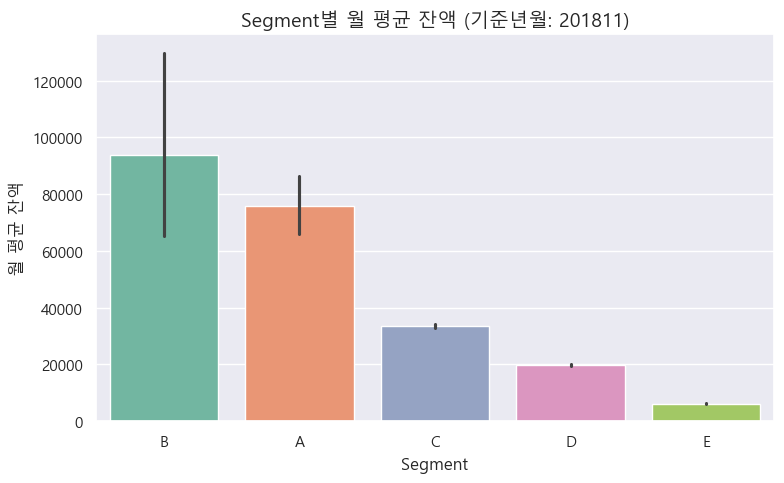

In [73]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['월중평잔']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='월중평잔',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 월 평균 잔액 (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('월 평균 잔액', fontsize=12)

plt.tight_layout()
plt.show()


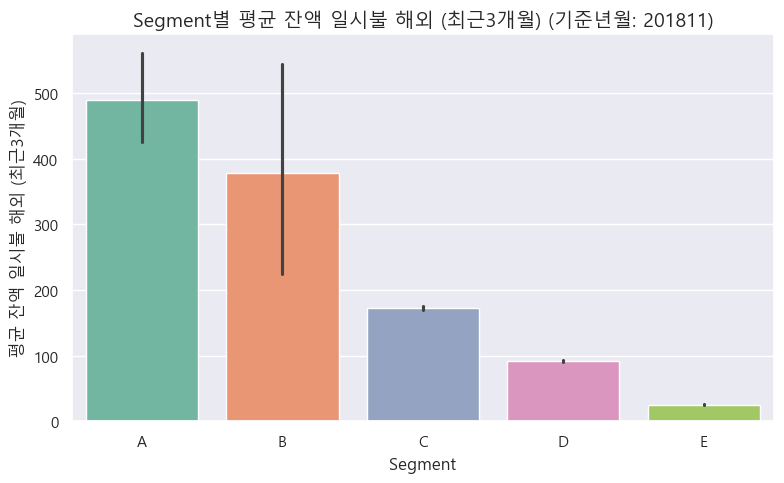

In [86]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['평잔_일시불_해외_3M']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='평잔_일시불_해외_3M',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 평균 잔액 일시불 해외 (최근3개월) (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('평균 잔액 일시불 해외 (최근3개월)', fontsize=12)

plt.tight_layout()
plt.show()


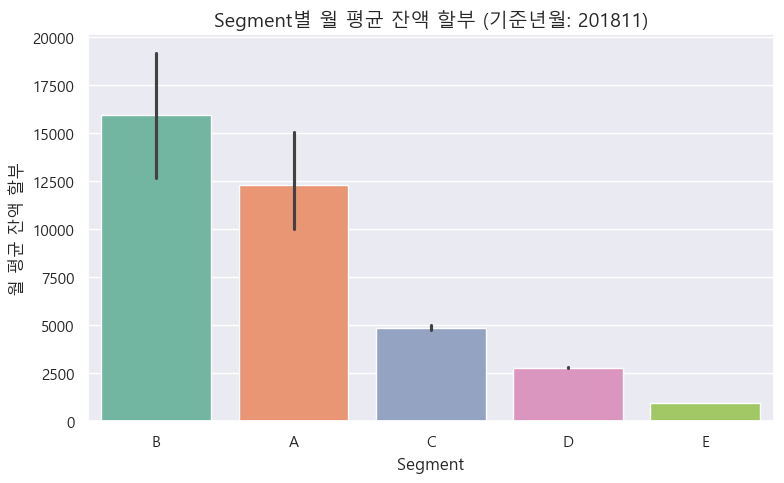

In [9]:
# 정렬 기준: 평균 청구금액 기준 내림차순
segment_order = (
    subset.groupby('Segment')['월중평잔_할부']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 색상 팔레트
palette = sns.color_palette("Set2")

# 시각화
plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=subset,
    x='Segment',
    y='월중평잔_할부',
    estimator='mean',
    order=segment_order,  # ✅ 정렬 반영
    palette=palette,
)

# 제목 및 축 설정
ax.set_title('Segment별 월 평균 잔액 할부 (기준년월: 201811)', fontsize=14)
ax.set_xlabel('Segment', fontsize=12)
ax.set_ylabel('월 평균 잔액 할부', fontsize=12)

plt.tight_layout()
plt.show()


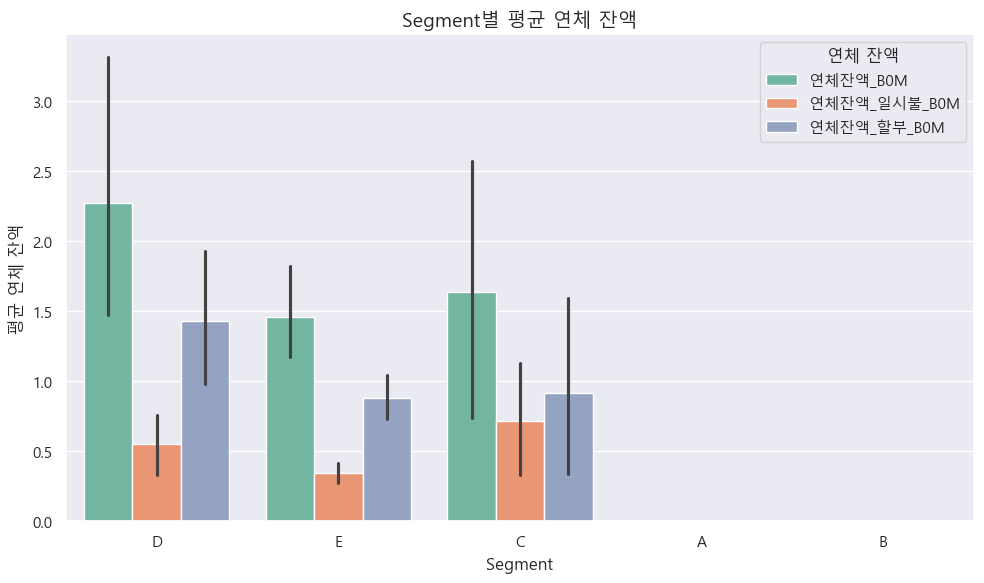

In [74]:
# 비교할 컬럼들
cols = ['연체잔액_B0M', '연체잔액_일시불_B0M', '연체잔액_할부_B0M']

# 데이터 재구조화 (wide → long)
melted = subset.melt(id_vars='Segment', value_vars=cols,
                     var_name='연체_시점', value_name='연체잔액')

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(
    data=melted,
    x='Segment',
    y='연체잔액',
    hue='연체_시점',  # 컬럼별 구분
    estimator='mean',
    palette='Set2'
)

# 제목 및 레이블
plt.title('Segment별 평균 연체 잔액', fontsize=14)
plt.xlabel('Segment', fontsize=12)
plt.ylabel('평균 연체 잔액', fontsize=12)
plt.legend(title='연체 잔액')
plt.tight_layout()
plt.show()


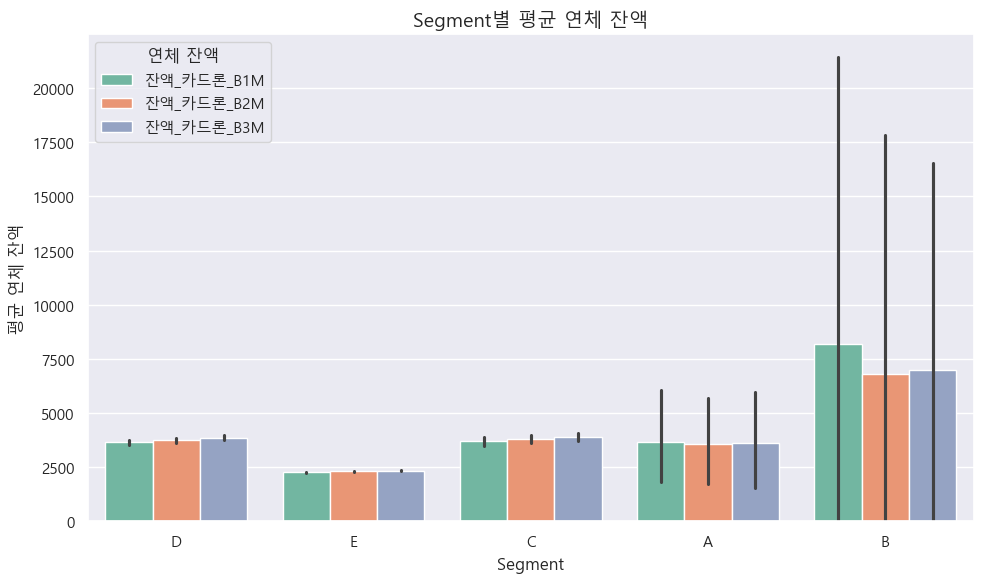

In [61]:
# 비교할 컬럼들
cols = ['잔액_카드론_B1M', '잔액_카드론_B2M', '잔액_카드론_B3M']

# 데이터 재구조화 (wide → long)
melted = subset.melt(id_vars='Segment', value_vars=cols,
                     var_name='연체_시점', value_name='연체잔액')

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(
    data=melted,
    x='Segment',
    y='연체잔액',
    hue='연체_시점',  # 컬럼별 구분
    estimator='mean',
    palette='Set2'
)

# 제목 및 레이블
plt.title('Segment별 평균 연체 잔액', fontsize=14)
plt.xlabel('Segment', fontsize=12)
plt.ylabel('평균 연체 잔액', fontsize=12)
plt.legend(title='연체 잔액')
plt.tight_layout()
plt.show()

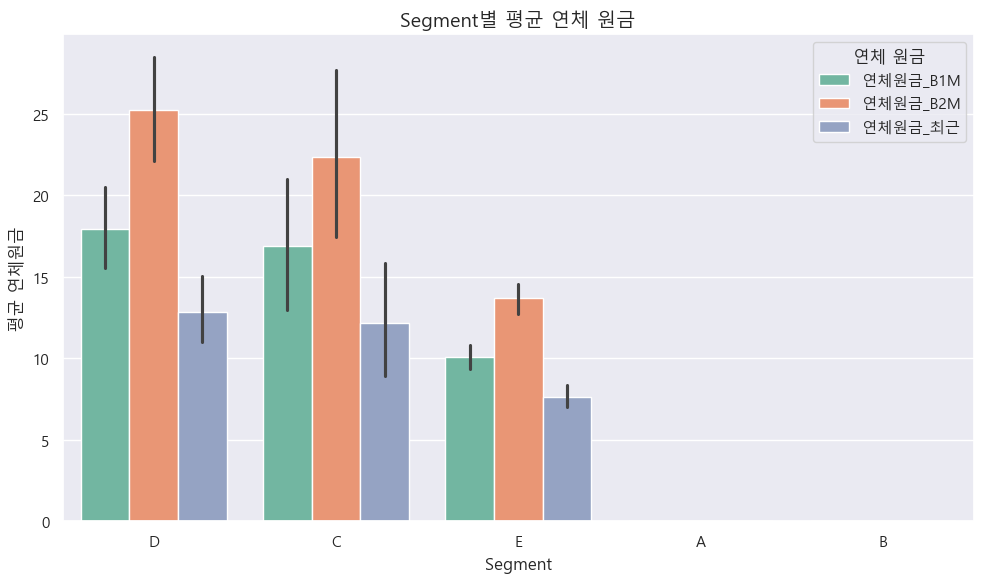

In [67]:
# 1. melt
cols = ['연체원금_B1M', '연체원금_B2M', '연체원금_최근']
melted = subset.melt(
    id_vars='Segment',
    value_vars=cols,
    var_name='연체_시점',
    value_name='연체원금'
)

# 2. Segment별 평균 연체잔액 계산 후 정렬 순서 추출
segment_order = (
    melted.groupby('Segment')['연체원금']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 3. 시각화
plt.figure(figsize=(10, 6))
sns.barplot(
    data=melted,
    x='Segment',
    y='연체원금',
    hue='연체_시점',
    order=segment_order,     # ✅ 정렬 적용
    estimator='mean',
    palette='Set2'
)

# 제목 및 축 설정
plt.title('Segment별 평균 연체 원금', fontsize=14)
plt.xlabel('Segment', fontsize=12)
plt.ylabel('평균 연체원금', fontsize=12)
plt.legend(title='연체 원금')
plt.tight_layout()
plt.show()


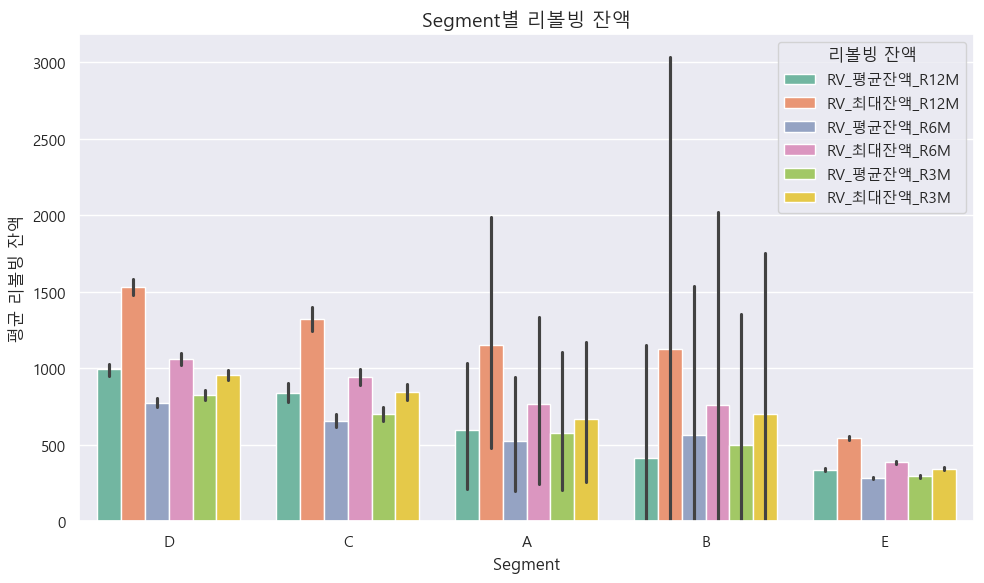

In [69]:
# 1. melt
cols = ['RV_평균잔액_R12M', 'RV_최대잔액_R12M', 'RV_평균잔액_R6M', 'RV_최대잔액_R6M', 'RV_평균잔액_R3M', 'RV_최대잔액_R3M']
melted = subset.melt(
    id_vars='Segment',
    value_vars=cols,
    var_name='리볼빙 잔액_시점',
    value_name='리볼빙 잔액'
)

# 2. Segment별 평균 연체잔액 계산 후 정렬 순서 추출
segment_order = (
    melted.groupby('Segment')['리볼빙 잔액']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 3. 시각화
plt.figure(figsize=(10, 6))
sns.barplot(
    data=melted,
    x='Segment',
    y='리볼빙 잔액',
    hue='리볼빙 잔액_시점',
    order=segment_order,     # ✅ 정렬 적용
    estimator='mean',
    palette='Set2'
)

# 제목 및 축 설정
plt.title('Segment별 리볼빙 잔액', fontsize=14)
plt.xlabel('Segment', fontsize=12)
plt.ylabel('평균 리볼빙 잔액', fontsize=12)
plt.legend(title='리볼빙 잔액')
plt.tight_layout()
plt.show()


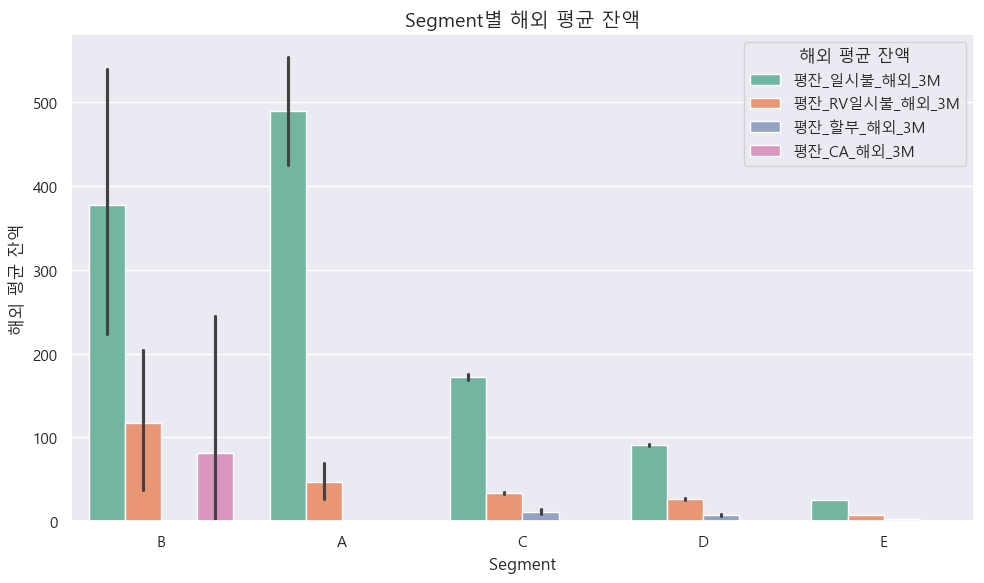

In [85]:
# 1. melt
cols = ['평잔_일시불_해외_3M', '평잔_RV일시불_해외_3M', '평잔_할부_해외_3M', '평잔_CA_해외_3M']
melted = subset.melt(
    id_vars='Segment',
    value_vars=cols,
    var_name='해외 평균 잔액_시점',
    value_name='해외 평균 잔액'
)

# 2. Segment별 평균 연체잔액 계산 후 정렬 순서 추출
segment_order = (
    melted.groupby('Segment')['해외 평균 잔액']
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

# 3. 시각화
plt.figure(figsize=(10, 6))
sns.barplot(
    data=melted,
    x='Segment',
    y='해외 평균 잔액',
    hue='해외 평균 잔액_시점',
    order=segment_order,     # ✅ 정렬 적용
    estimator='mean',
    palette='Set2'
)

# 제목 및 축 설정
plt.title('Segment별 해외 평균 잔액', fontsize=14)
plt.xlabel('Segment', fontsize=12)
plt.ylabel('해외 평균 잔액', fontsize=12)
plt.legend(title='해외 평균 잔액')
plt.tight_layout()
plt.show()


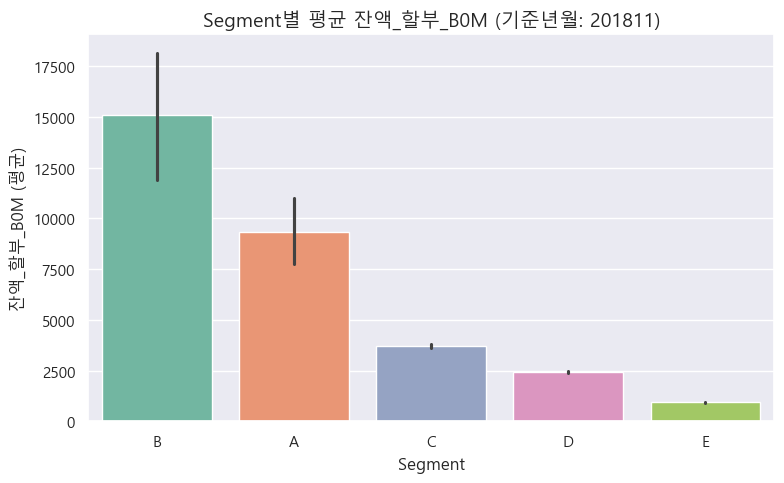

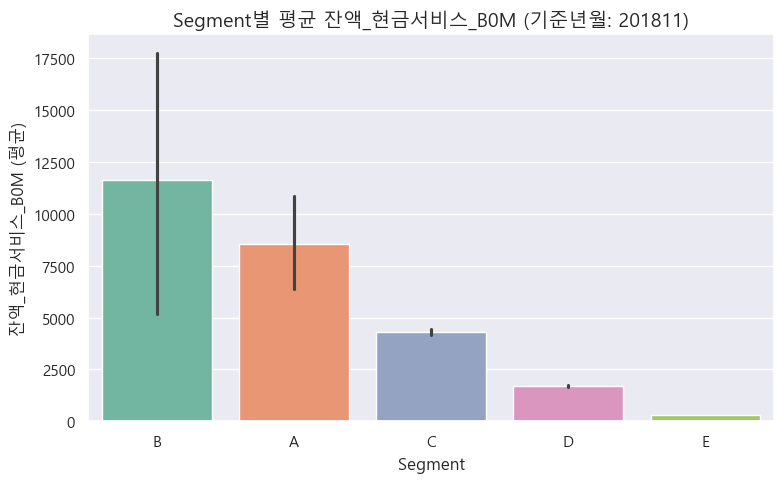

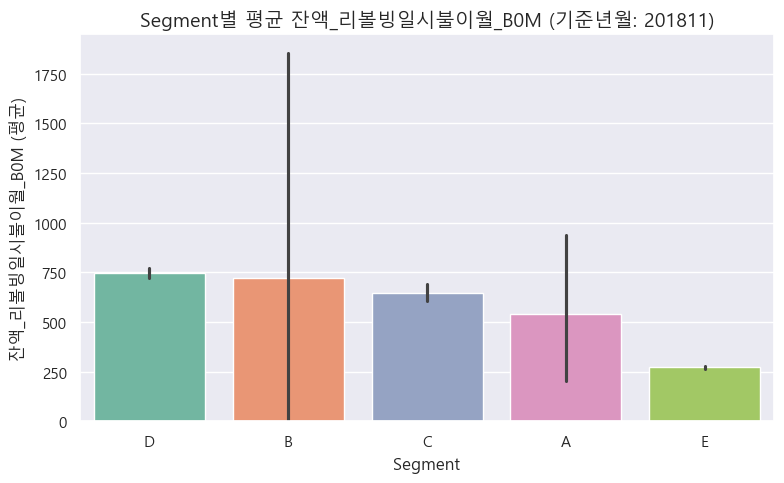

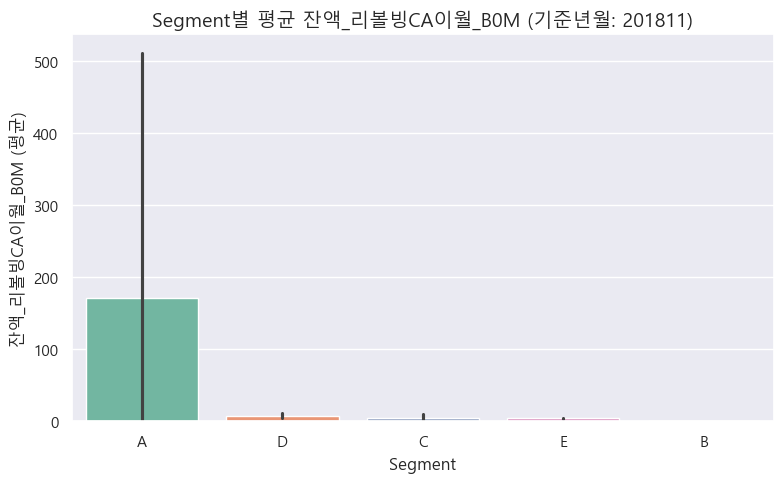

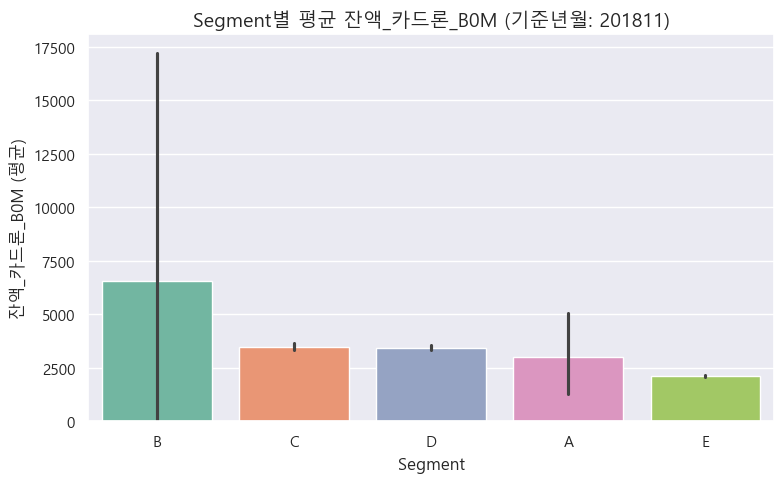

...

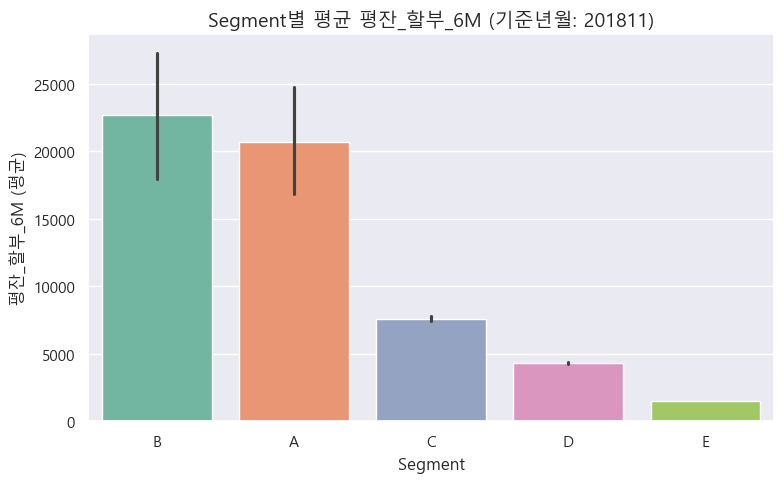

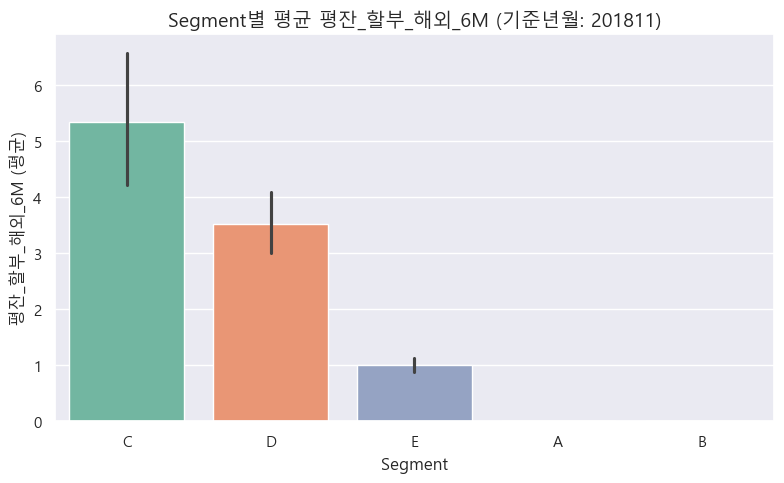

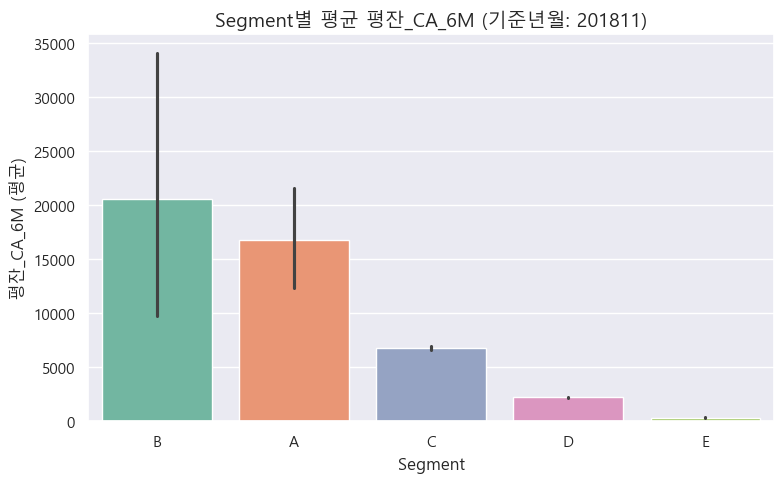

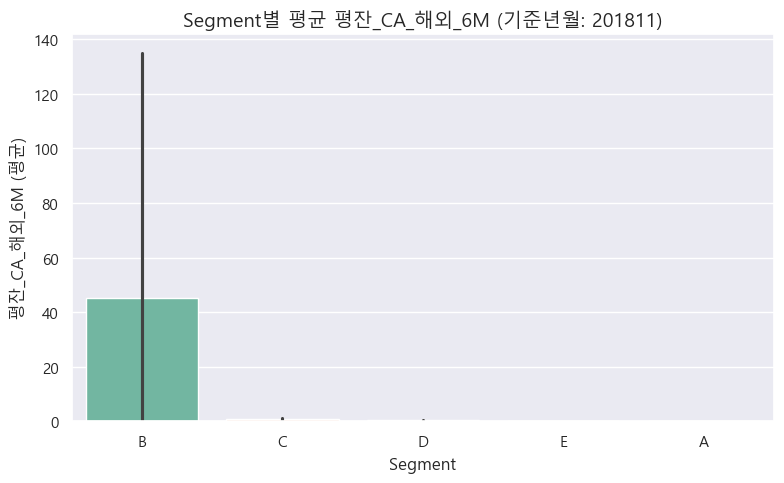

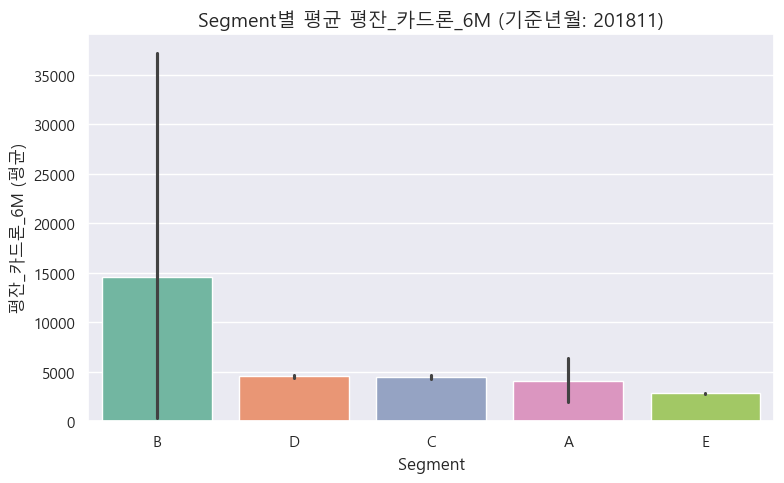

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화 함수
def plot_segment_barplot(subset, value_col, 기준월='201811'):
    try:
        segment_order = (
            subset.groupby('Segment')[value_col]
            .mean()
            .sort_values(ascending=False)
            .index.tolist()
        )

        plt.figure(figsize=(8, 5))
        ax = sns.barplot(
            data=subset,
            x='Segment',
            y=value_col,
            estimator='mean',
            order=segment_order,
            palette=sns.color_palette("Set2"),
        )

        ax.set_title(f'Segment별 평균 {value_col} (기준년월: {기준월})', fontsize=14)
        ax.set_xlabel('Segment', fontsize=12)
        ax.set_ylabel(f'{value_col} (평균)', fontsize=12)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❗ 컬럼 '{value_col}' 시각화 중 오류 발생: {e}")

# 시각화할 컬럼 리스트 (앞서 받은 것 + 추가된 컬럼)
columns_to_plot = [
    # 앞서 받은 포인트, 마일리지, 할인, 연체 관련 컬럼 생략...
    
    # 새로 추가된 잔액/평잔 관련 컬럼
    "잔액_할부_B0M", "잔액_현금서비스_B0M", "잔액_리볼빙일시불이월_B0M", "잔액_리볼빙CA이월_B0M",
    "잔액_카드론_B0M", "월중평잔_할부_B0M", "월중평잔_CA_B0M", "연체잔액_B0M",
    "연체잔액_일시불_B0M", "연체잔액_할부_B0M", "연체잔액_현금서비스_B0M", "연체잔액_카드론_B0M",
    "연체잔액_대환론_B0M", "잔액_현금서비스_B1M", "잔액_현금서비스_B2M", "잔액_카드론_B1M",
    "잔액_카드론_B2M", "잔액_카드론_B3M", "잔액_카드론_B4M", "잔액_카드론_B5M",
    "잔액_할부_B1M", "잔액_할부_B2M", "연체원금_B1M", "연체원금_B2M", "연체원금_최근",
    "매각잔액_B1M", "RV_평균잔액_R12M", "RV_최대잔액_R12M", "RV_평균잔액_R6M",
    "RV_최대잔액_R6M", "RV_평균잔액_R3M", "RV_최대잔액_R3M",
    "잔액_할부_유이자_B0M", "잔액_할부_무이자_B0M", "잔액_할부_해외_B0M",
    "연체잔액_RV일시불_B0M", "연체잔액_CA_B0M", "월중평잔", "월중평잔_RV일시불",
    "월중평잔_CA", "월중평잔_카드론", "평잔_3M", "평잔_일시불_해외_3M", "평잔_RV일시불_3M",
    "평잔_RV일시불_해외_3M", "평잔_할부_3M", "평잔_할부_해외_3M", "평잔_CA_3M",
    "평잔_CA_해외_3M", "평잔_카드론_3M", "평잔_6M", "평잔_RV일시불_6M", "평잔_RV일시불_해외_6M",
    "평잔_할부_6M", "평잔_할부_해외_6M", "평잔_CA_6M", "평잔_CA_해외_6M", "평잔_카드론_6M"
]

# 반복 실행
for col in columns_to_plot:
    plot_segment_barplot(subset, col)

In [40]:
def plot_segment_histogram(subset, value_col, 기준월='201811', bins=10):
    try:
        if not pd.api.types.is_numeric_dtype(subset[value_col]):
            print(f"⚠️ '{value_col}'은 수치형이 아니므로 스킵합니다.")
            return

        plt.figure(figsize=(10, 5))
        sns.histplot(
            data=subset,
            x=value_col,
            hue='Segment',
            multiple='dodge',  # 겹치지 않게 옆으로 나란히
            palette='Set2',
            bins=bins,
            shrink=0.8,
            edgecolor="gray"
        )
        plt.title(f"{value_col} 도수분포 (기준년월: {기준월})", fontsize=14)
        plt.xlabel("값의 구간", fontsize=12)
        plt.ylabel("도수 (빈도수)", fontsize=12)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❗ 히스토그램 시각화 오류 ({value_col}): {e}")


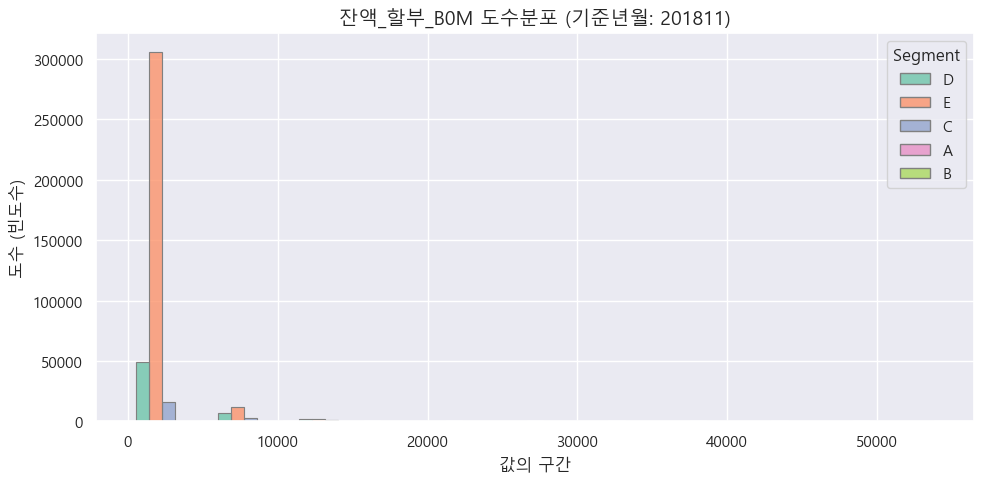

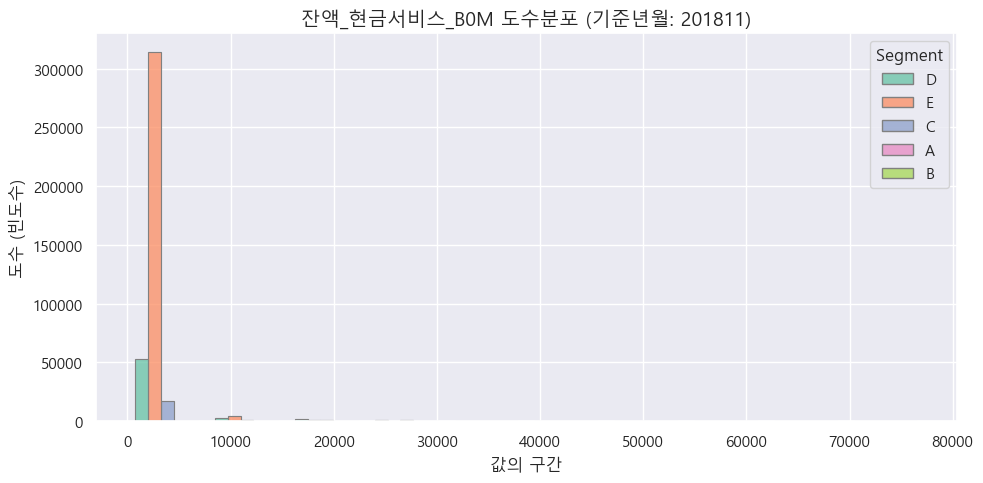

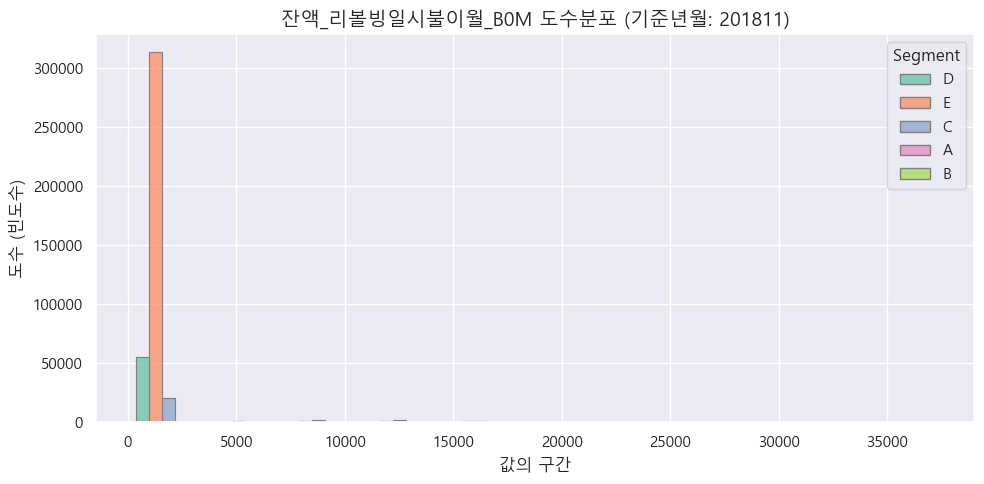

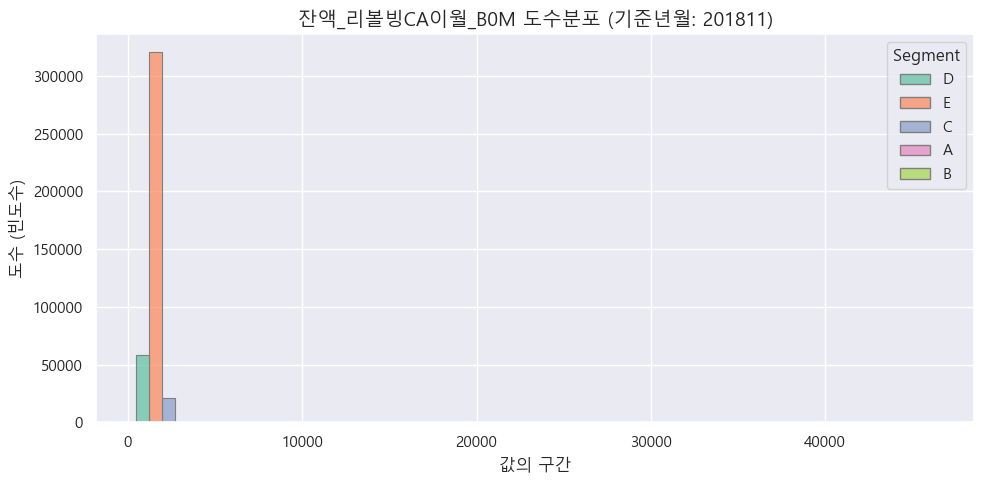

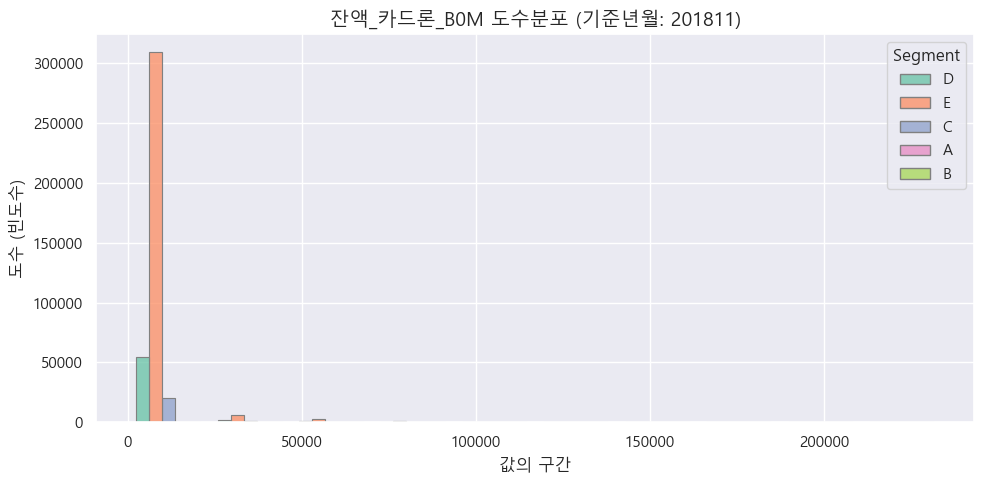

...

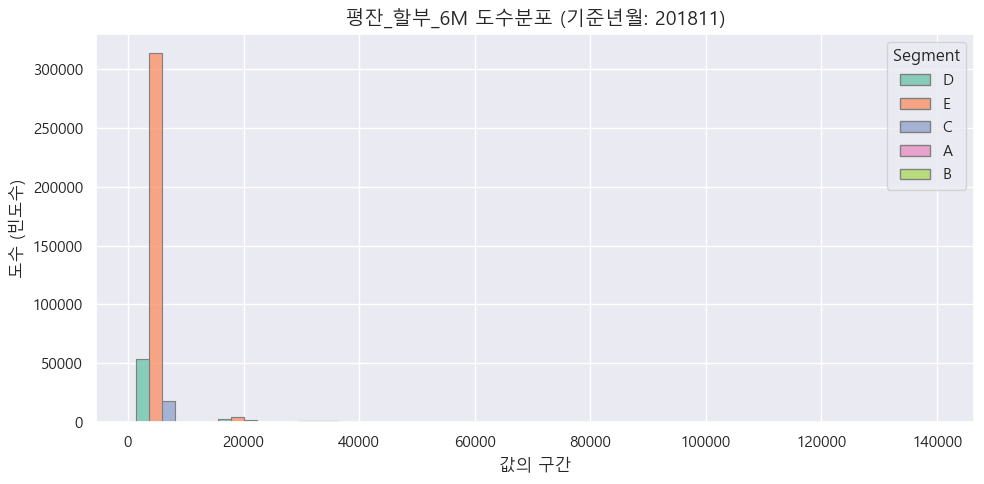

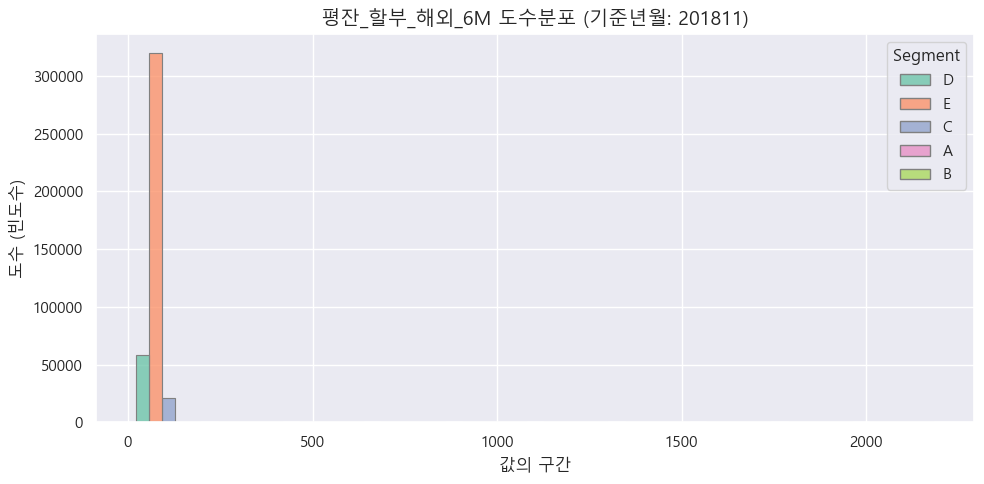

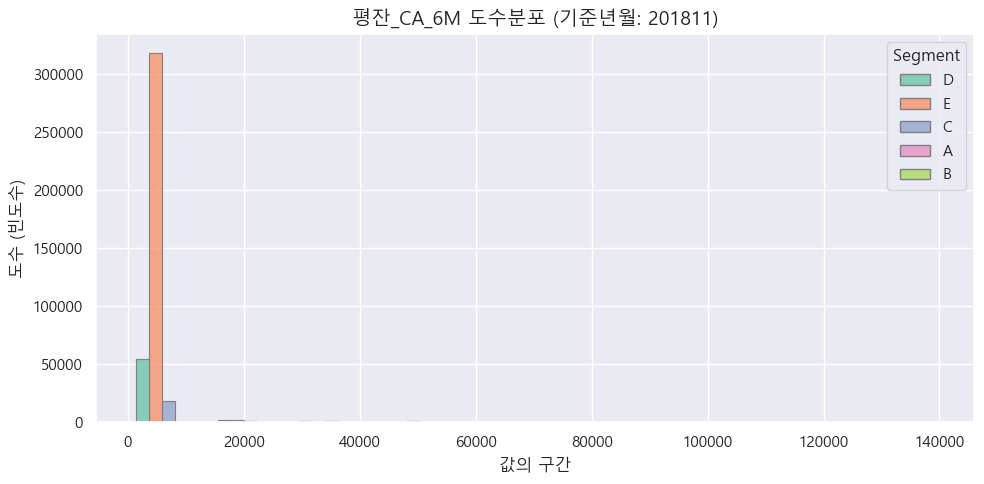

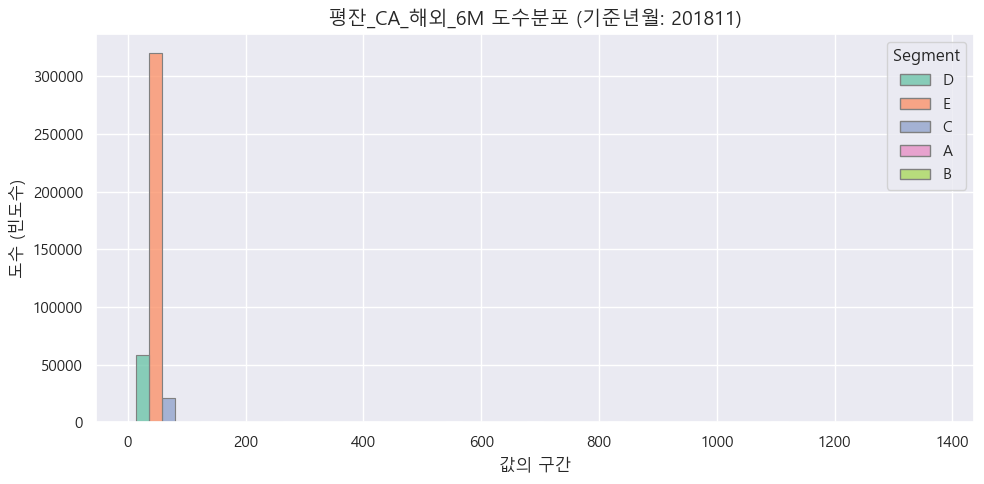

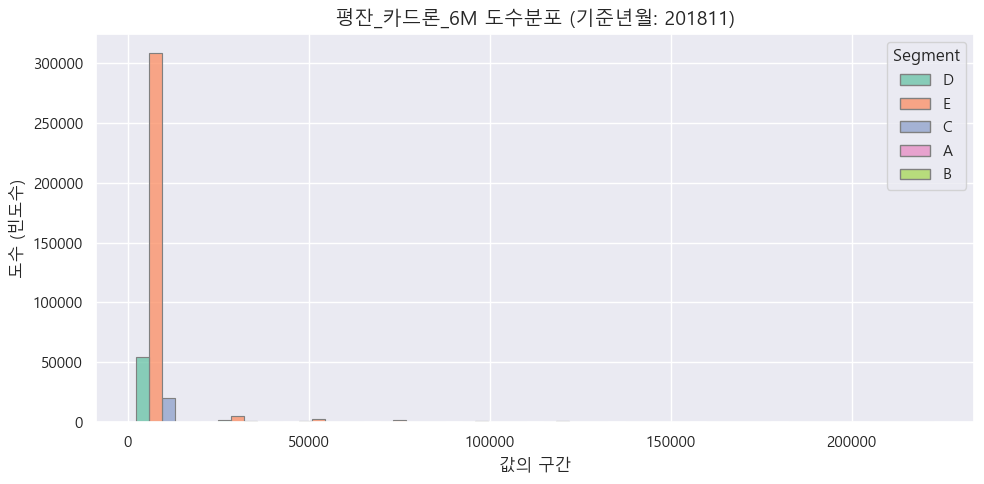

In [50]:
# 시각화할 컬럼 리스트 (앞서 받은 것 + 추가된 컬럼)
columns_to_plot = [
    # 앞서 받은 포인트, 마일리지, 할인, 연체 관련 컬럼 생략...
    
    # 새로 추가된 잔액/평잔 관련 컬럼
    "잔액_할부_B0M", "잔액_현금서비스_B0M", "잔액_리볼빙일시불이월_B0M", "잔액_리볼빙CA이월_B0M",
    "잔액_카드론_B0M", "월중평잔_할부_B0M", "월중평잔_CA_B0M", "연체잔액_B0M",
    "연체잔액_일시불_B0M", "연체잔액_할부_B0M", "연체잔액_현금서비스_B0M", "연체잔액_카드론_B0M",
    "연체잔액_대환론_B0M", "잔액_현금서비스_B1M", "잔액_현금서비스_B2M", "잔액_카드론_B1M",
    "잔액_카드론_B2M", "잔액_카드론_B3M", "잔액_카드론_B4M", "잔액_카드론_B5M",
    "잔액_할부_B1M", "잔액_할부_B2M", "연체원금_B1M", "연체원금_B2M", "연체원금_최근",
    "매각잔액_B1M", "RV_평균잔액_R12M", "RV_최대잔액_R12M", "RV_평균잔액_R6M",
    "RV_최대잔액_R6M", "RV_평균잔액_R3M", "RV_최대잔액_R3M",
    "잔액_할부_유이자_B0M", "잔액_할부_무이자_B0M", "잔액_할부_해외_B0M",
    "연체잔액_RV일시불_B0M", "연체잔액_CA_B0M", "월중평잔", "월중평잔_RV일시불",
    "월중평잔_CA", "월중평잔_카드론", "평잔_3M", "평잔_일시불_해외_3M", "평잔_RV일시불_3M",
    "평잔_RV일시불_해외_3M", "평잔_할부_3M", "평잔_할부_해외_3M", "평잔_CA_3M",
    "평잔_CA_해외_3M", "평잔_카드론_3M", "평잔_6M", "평잔_RV일시불_6M", "평잔_RV일시불_해외_6M",
    "평잔_할부_6M", "평잔_할부_해외_6M", "평잔_CA_6M", "평잔_CA_해외_6M", "평잔_카드론_6M"
]

for col in columns_to_plot:
    plot_segment_histogram(subset, col)

In [44]:
def plot_segment_kde(subset, value_col):
    try:
        # 수치형이 아닐 경우 스킵
        if not pd.api.types.is_numeric_dtype(subset[value_col]):
            print(f"⚠️ 컬럼 '{value_col}'은 수치형이 아니므로 스킵합니다.")
            return

        plt.figure(figsize=(10, 5))
        sns.kdeplot(
            data=subset,
            x=value_col,
            hue="Segment",
            common_norm=False,  # 세그먼트별 독립 밀도 계산
            fill=True,
            alpha=0.3,
            linewidth=1.5,
        )
        plt.title(f"{value_col} 분포 (KDE) by Segment")
        plt.xlabel(value_col)
        plt.ylabel("밀도")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❗ KDE 시각화 오류 ({value_col}): {e}")


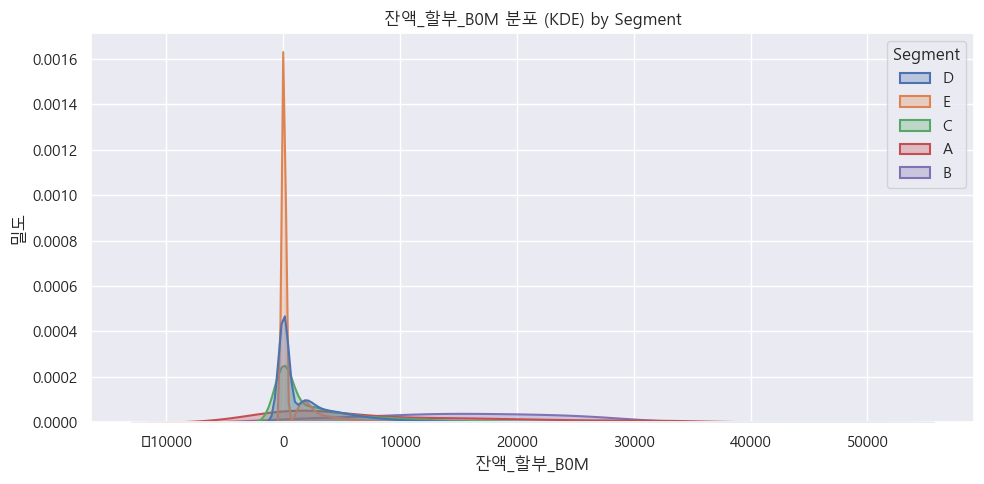

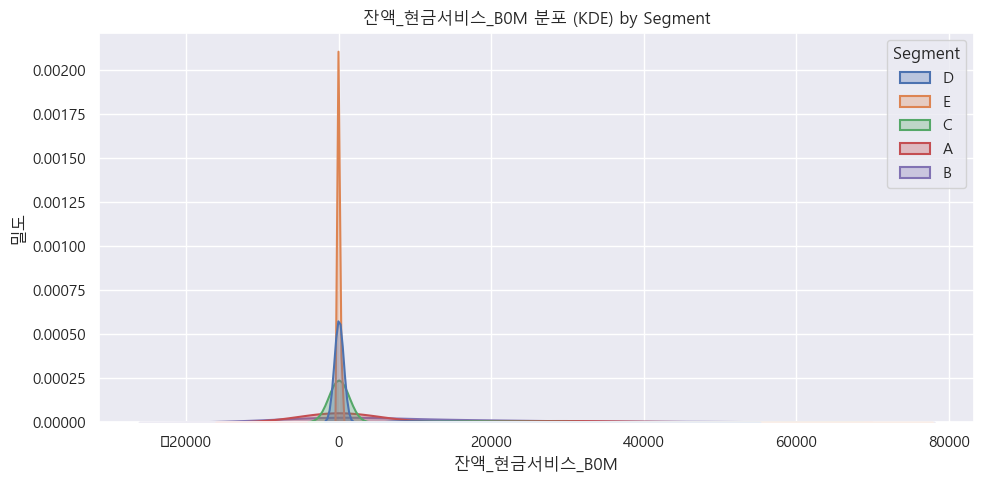

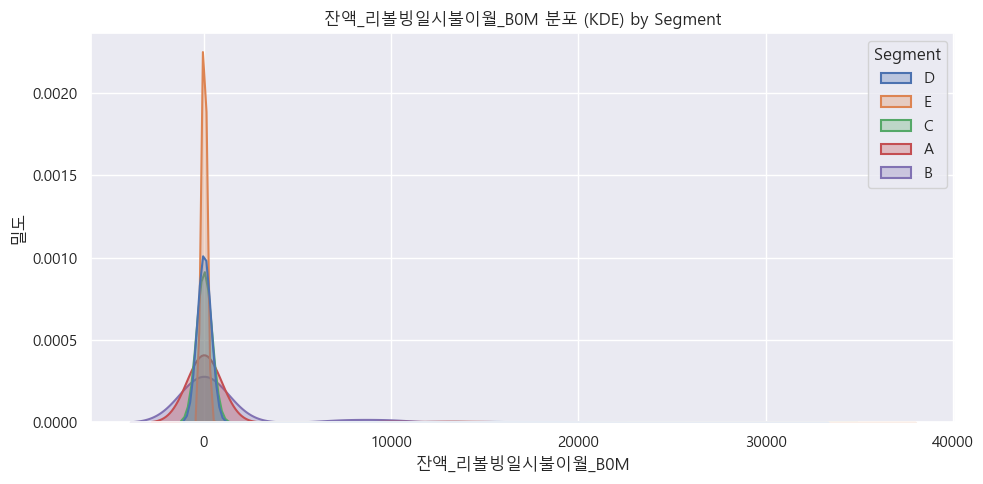

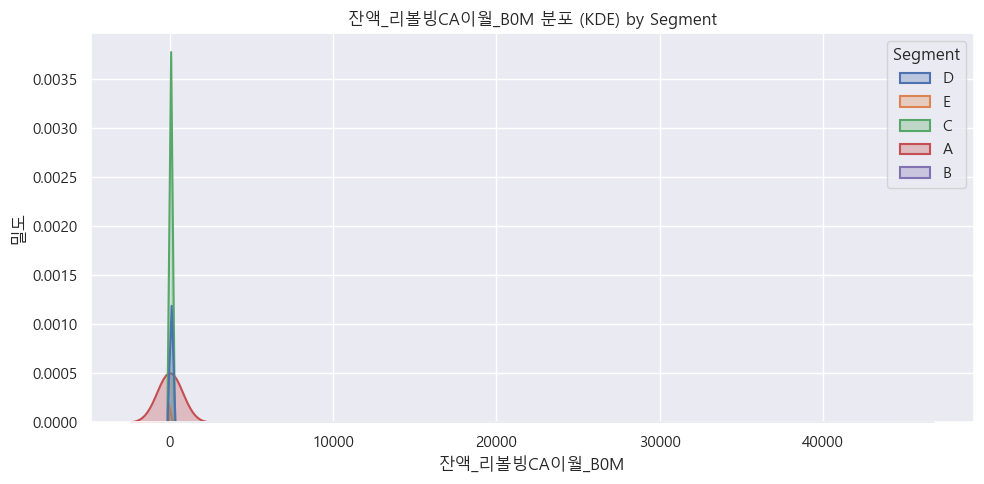

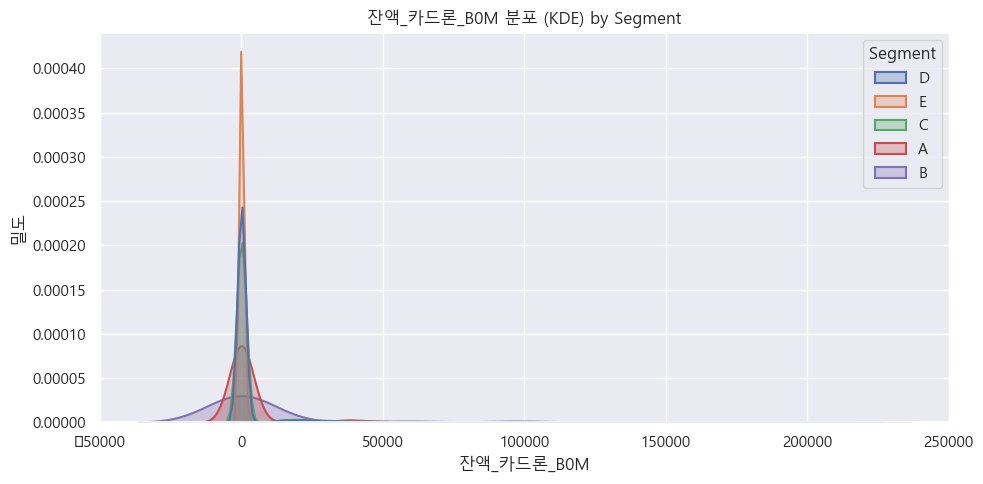

...

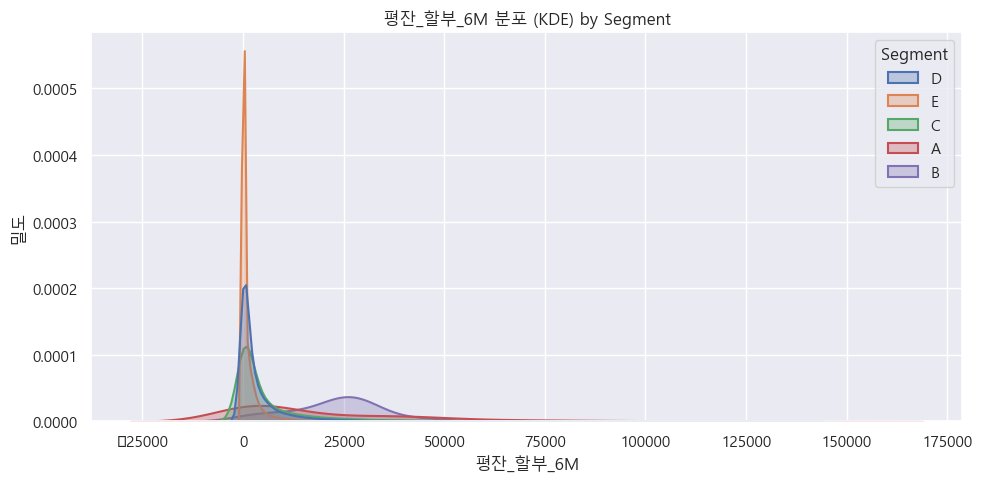

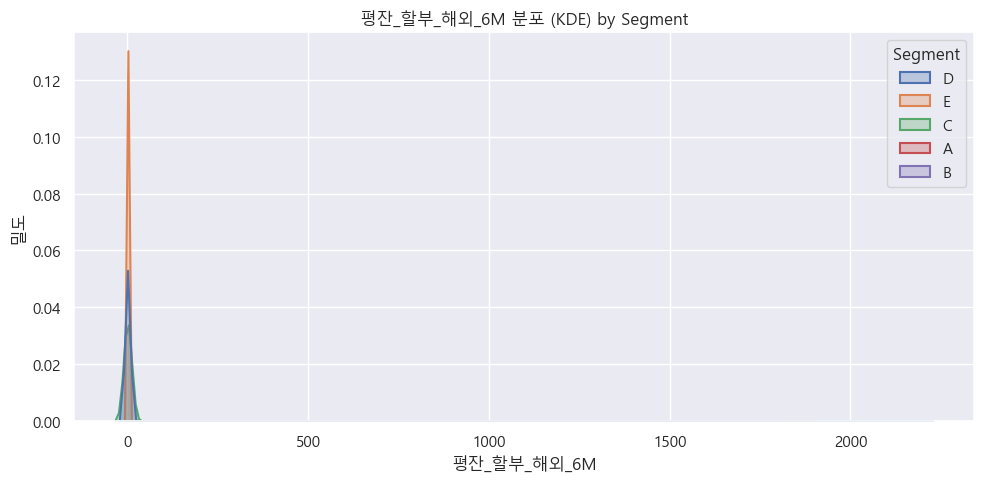

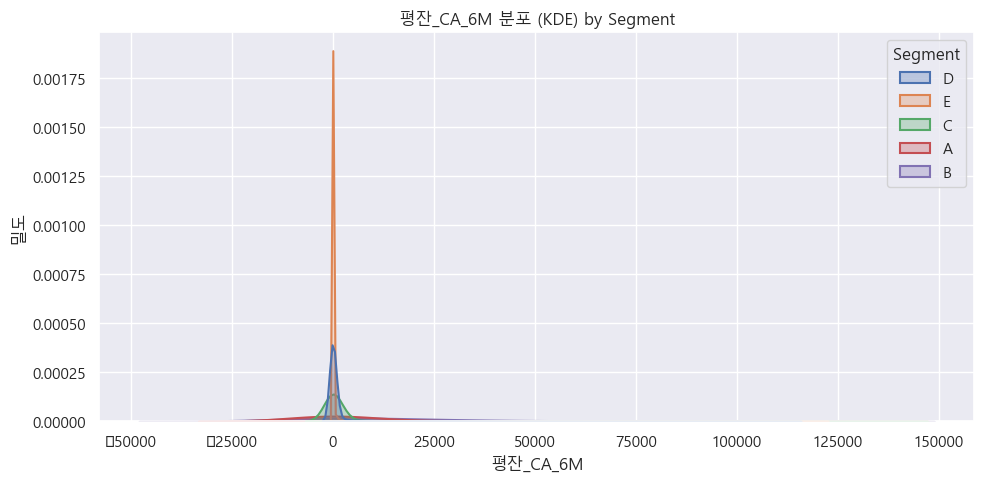

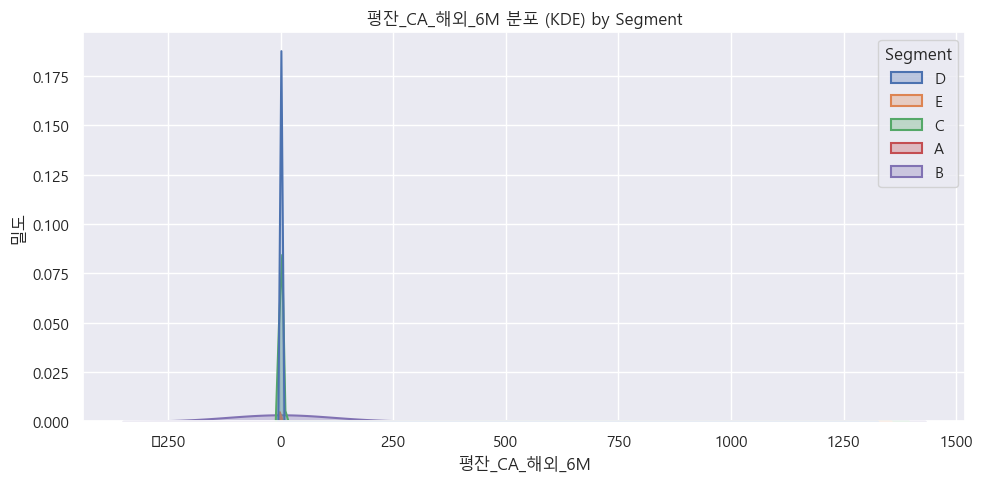

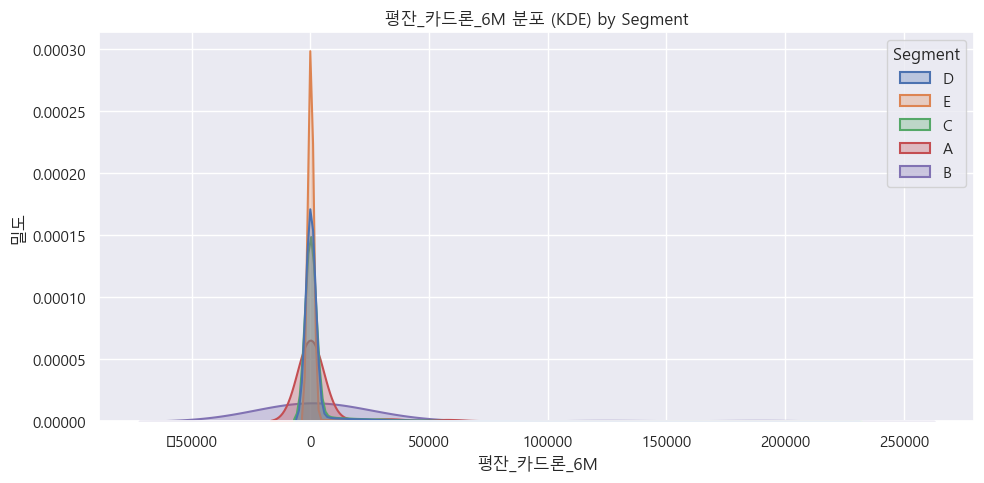

In [49]:
# 시각화할 컬럼 리스트 (앞서 받은 것 + 추가된 컬럼)
columns_to_plot = [
    # 앞서 받은 포인트, 마일리지, 할인, 연체 관련 컬럼 생략...
    
    # 새로 추가된 잔액/평잔 관련 컬럼
    "잔액_할부_B0M", "잔액_현금서비스_B0M", "잔액_리볼빙일시불이월_B0M", "잔액_리볼빙CA이월_B0M",
    "잔액_카드론_B0M", "월중평잔_할부_B0M", "월중평잔_CA_B0M", "연체잔액_B0M",
    "연체잔액_일시불_B0M", "연체잔액_할부_B0M", "연체잔액_현금서비스_B0M", "연체잔액_카드론_B0M",
    "연체잔액_대환론_B0M", "잔액_현금서비스_B1M", "잔액_현금서비스_B2M", "잔액_카드론_B1M",
    "잔액_카드론_B2M", "잔액_카드론_B3M", "잔액_카드론_B4M", "잔액_카드론_B5M",
    "잔액_할부_B1M", "잔액_할부_B2M", "연체원금_B1M", "연체원금_B2M", "연체원금_최근",
    "매각잔액_B1M", "RV_평균잔액_R12M", "RV_최대잔액_R12M", "RV_평균잔액_R6M",
    "RV_최대잔액_R6M", "RV_평균잔액_R3M", "RV_최대잔액_R3M",
    "잔액_할부_유이자_B0M", "잔액_할부_무이자_B0M", "잔액_할부_해외_B0M",
    "연체잔액_RV일시불_B0M", "연체잔액_CA_B0M", "월중평잔", "월중평잔_RV일시불",
    "월중평잔_CA", "월중평잔_카드론", "평잔_3M", "평잔_일시불_해외_3M", "평잔_RV일시불_3M",
    "평잔_RV일시불_해외_3M", "평잔_할부_3M", "평잔_할부_해외_3M", "평잔_CA_3M",
    "평잔_CA_해외_3M", "평잔_카드론_3M", "평잔_6M", "평잔_RV일시불_6M", "평잔_RV일시불_해외_6M",
    "평잔_할부_6M", "평잔_할부_해외_6M", "평잔_CA_6M", "평잔_CA_해외_6M", "평잔_카드론_6M"
]

for col in columns_to_plot:
    plot_segment_kde(subset, col)

In [9]:
# 시각화할 컬럼 리스트 (앞서 받은 것 + 추가된 컬럼)
columns_to_plot = [
    # 앞서 받은 포인트, 마일리지, 할인, 연체 관련 컬럼 생략...
    
    # 새로 추가된 잔액/평잔 관련 컬럼
    "잔액_할부_B0M", "잔액_현금서비스_B0M", "잔액_리볼빙일시불이월_B0M", "잔액_리볼빙CA이월_B0M",
    "잔액_카드론_B0M", "월중평잔_할부_B0M", "월중평잔_CA_B0M", "연체잔액_B0M",
    "연체잔액_일시불_B0M", "연체잔액_할부_B0M", "연체잔액_현금서비스_B0M", "연체잔액_카드론_B0M",
    "연체잔액_대환론_B0M", "잔액_현금서비스_B1M", "잔액_현금서비스_B2M", "잔액_카드론_B1M",
    "잔액_카드론_B2M", "잔액_카드론_B3M", "잔액_카드론_B4M", "잔액_카드론_B5M",
    "잔액_할부_B1M", "잔액_할부_B2M", "연체원금_B1M", "연체원금_B2M", "연체원금_최근",
    "매각잔액_B1M", "RV_평균잔액_R12M", "RV_최대잔액_R12M", "RV_평균잔액_R6M",
    "RV_최대잔액_R6M", "RV_평균잔액_R3M", "RV_최대잔액_R3M",
    "잔액_할부_유이자_B0M", "잔액_할부_무이자_B0M", "잔액_할부_해외_B0M",
    "연체잔액_RV일시불_B0M", "연체잔액_CA_B0M", "월중평잔", "월중평잔_RV일시불",
    "월중평잔_CA", "월중평잔_카드론", "평잔_3M", "평잔_일시불_해외_3M", "평잔_RV일시불_3M",
    "평잔_RV일시불_해외_3M", "평잔_할부_3M", "평잔_할부_해외_3M", "평잔_CA_3M",
    "평잔_CA_해외_3M", "평잔_카드론_3M", "평잔_6M", "평잔_RV일시불_6M", "평잔_RV일시불_해외_6M",
    "평잔_할부_6M", "평잔_할부_해외_6M", "평잔_CA_6M", "평잔_CA_해외_6M", "평잔_카드론_6M"
]

In [11]:
# 수치형 변수만 추출 (문자형은 제외)
numeric_columns = [col for col in columns_to_plot if pd.api.types.is_numeric_dtype(subset[col])]

# 전체 분산 계산
subset[numeric_columns].var().sort_values(ascending=False)


평잔_6M              9.212391e+08
평잔_3M              7.403417e+08
월중평잔               6.774156e+08
평잔_카드론_6M          2.611568e+08
평잔_카드론_3M          2.125586e+08
잔액_카드론_B5M         1.919623e+08
잔액_카드론_B4M         1.658759e+08
잔액_카드론_B3M         1.646411e+08
잔액_카드론_B2M         1.623545e+08
잔액_카드론_B1M         1.591729e+08
월중평잔_카드론           1.497361e+08
잔액_카드론_B0M         1.320125e+08
평잔_할부_6M           4.496728e+07
평잔_CA_6M           3.042903e+07
평잔_할부_3M           2.887678e+07
평잔_RV일시불_3M        2.793721e+07
평잔_RV일시불_6M        2.721802e+07
평잔_CA_3M           2.609335e+07
잔액_할부_B2M          2.271979e+07
월중평잔_RV일시불         2.181335e+07
잔액_할부_B1M          2.001433e+07
월중평잔_할부_B0M        1.838682e+07
RV_최대잔액_R12M       1.834968e+07
잔액_현금서비스_B1M       1.783920e+07
잔액_현금서비스_B2M       1.758846e+07
월중평잔_CA_B0M        1.738692e+07
월중평잔_CA            1.694238e+07
잔액_현금서비스_B0M       1.381841e+07
RV_평균잔액_R12M       1.110936e+07
RV_최대잔액_R6M        9.504301e+06
잔액_할부_B0M          8.787731e+06
RV_최대잔액_

In [13]:
# 세그먼트 기준으로 변수별 분산 비교
subset.groupby('Segment')[numeric_columns].var()


,잔액_할부_B0M,잔액_현금서비스_B0M,잔액_리볼빙일시불이월_B0M,잔액_리볼빙CA이월_B0M,잔액_카드론_B0M,월중평잔_할부_B0M,월중평잔_CA_B0M,연체잔액_B0M,연체잔액_일시불_B0M,연체잔액_할부_B0M,...,평잔_CA_해외_3M,평잔_카드론_3M,평잔_6M,평잔_RV일시불_6M,평잔_RV일시불_해외_6M,평잔_할부_6M,평잔_할부_해외_6M,평잔_CA_6M,평잔_CA_해외_6M,평잔_카드론_6M
Segment,,,,,,,,,,,,,,,,,,,,,
A,1.122393e+08,2.205366e+08,6.628532e+06,4.720299e+06,1.409726e+08,2.506620e+08,3.594424e+08,0.000000,0.000000,0.000000,...,0.000000,1.964148e+08,4.649140e+09,4.972517e+07,18687.710452,6.643260e+08,0.000000,9.381441e+08,0.000000,2.358408e+08
B,6.722919e+07,2.709697e+08,6.110680e+06,0.000000e+00,5.278241e+08,8.037299e+07,3.865644e+08,0.000000,0.000000,0.000000,...,160720.666667,8.515482e+08,5.577556e+09,1.941112e+07,36667.650362,1.277346e+08,0.000000,9.087233e+08,48690.041667,2.057724e+09
C,3.557723e+07,9.672234e+07,9.247845e+06,1.626258e+05,1.642335e+08,9.410628e+07,1.402651e+08,4834.263903,877.766322,2248.477505,...,0.000000,2.361896e+08,2.674383e+09,7.100154e+07,11160.892401,2.224199e+08,6973.766475,2.722650e+08,826.520519,2.961393e+08
D,1.603481e+07,2.968722e+07,1.088378e+07,1.805437e+05,1.738145e+08,3.569967e+07,3.626563e+07,13003.558226,695.486001,3395.913824,...,64.859020,2.667101e+08,1.649165e+09,6.977845e+07,8414.690443,8.293822e+07,4531.183966,5.715559e+07,332.543062,3.407194e+08
E,4.837023e+06,4.061089e+06,3.773720e+06,8.646422e+04,1.218916e+08,8.687697e+06,4.015185e+06,8563.791654,405.320606,2064.496827,...,10.986308,2.007399e+08,5.836048e+08,1.600529e+07,2378.075685,2.255242e+07,1266.280214,5.941435e+06,134.607233,2.436776e+08


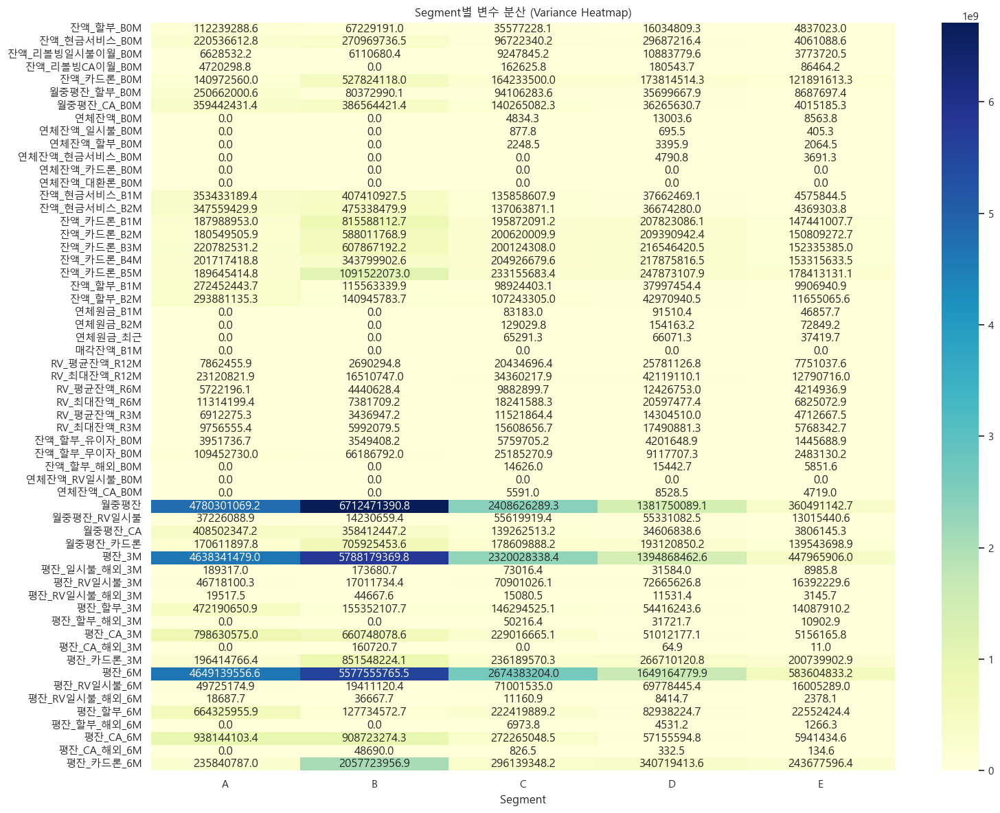

In [19]:
# 세그먼트별 변수 분산 테이블
var_table = subset.groupby('Segment')[numeric_columns].var().T

# 분산 히트맵
import seaborn as sns
plt.figure(figsize=(16, 12))
sns.heatmap(var_table, annot=True, fmt=".1f", cmap="YlGnBu")
plt.title("Segment별 변수 분산 (Variance Heatmap)")
plt.tight_layout()
plt.show()


In [21]:
columns = [
    "평잔_카드론_6M", "평잔_CA_해외_6M", "평잔_CA_해외_3M", "연체잔액_현금서비스_B0M",
    "평잔_할부_해외_6M", "평잔_할부_해외_3M", "평잔_일시불_해외_3M", "연체잔액_일시불_B0M"
]

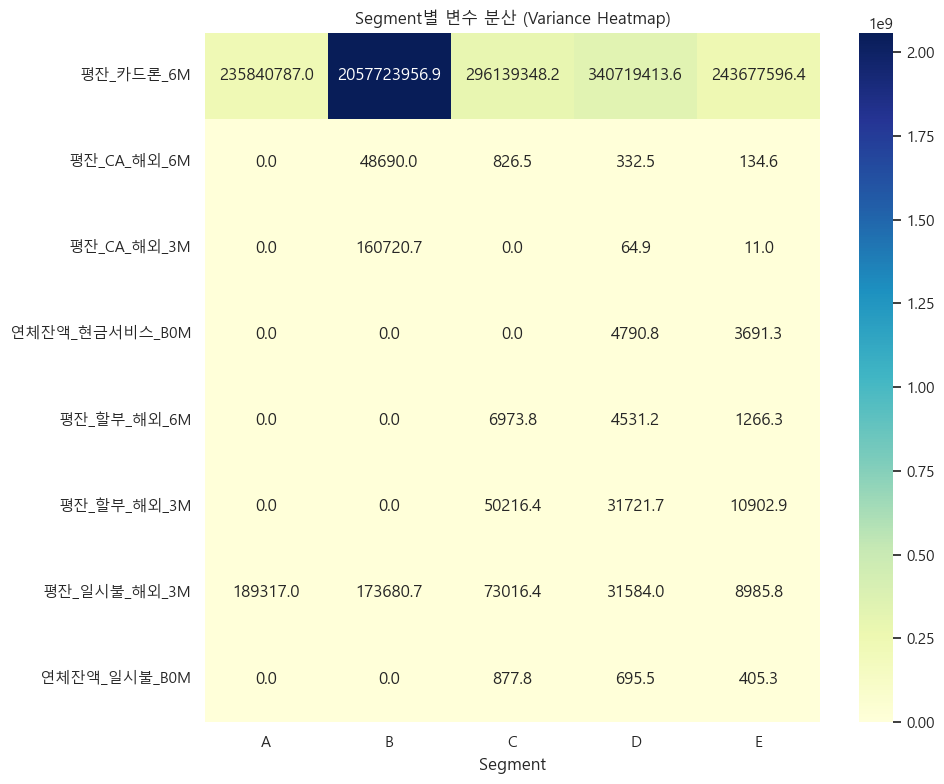

In [27]:
# 세그먼트별 변수 분산 테이블
var_table = subset.groupby('Segment')[columns].var().T

# 분산 히트맵
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(var_table, annot=True, fmt=".1f", cmap="YlGnBu")
plt.title("Segment별 변수 분산 (Variance Heatmap)")
plt.tight_layout()
plt.show()


In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_segment_scatter_grid(df, columns, row_var="Segment", max_cols=4):
    cols_per_plot = max_cols
    num_chunks = len(columns) // cols_per_plot + int(len(columns) % cols_per_plot > 0)

    for i in range(num_chunks):
        cols_chunk = columns[i * cols_per_plot: (i + 1) * cols_per_plot]
        melted = df.melt(id_vars=row_var, value_vars=cols_chunk, var_name="Variable", value_name="Value")

        g = sns.FacetGrid(melted, col="Variable", col_wrap=cols_per_plot, sharex=False, height=4)
        g.map_dataframe(sns.stripplot, y=row_var, x="Value", alpha=0.5, jitter=True, size=3)
        g.set_titles("{col_name}")
        g.set_axis_labels("Value", row_var)
        plt.tight_layout()
        plt.show()


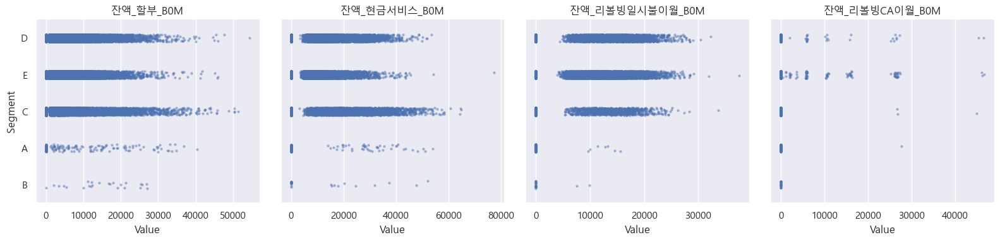

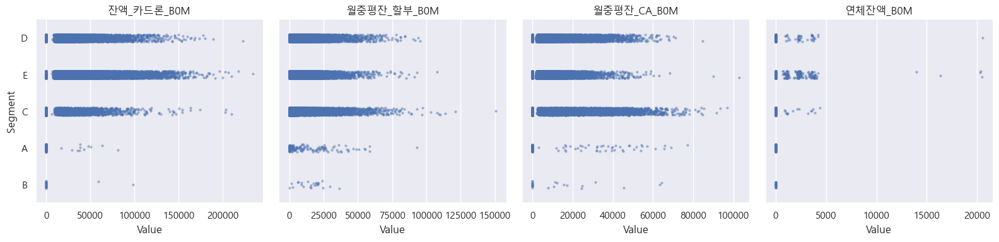

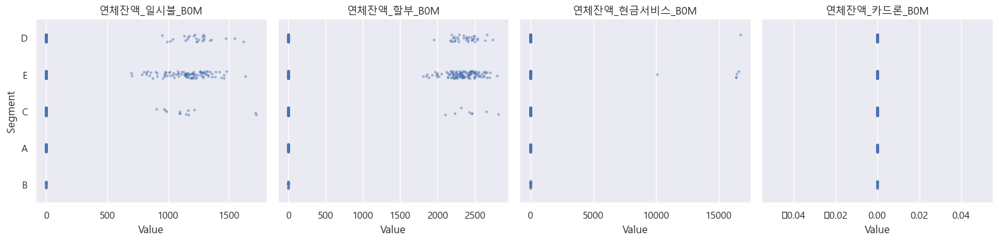

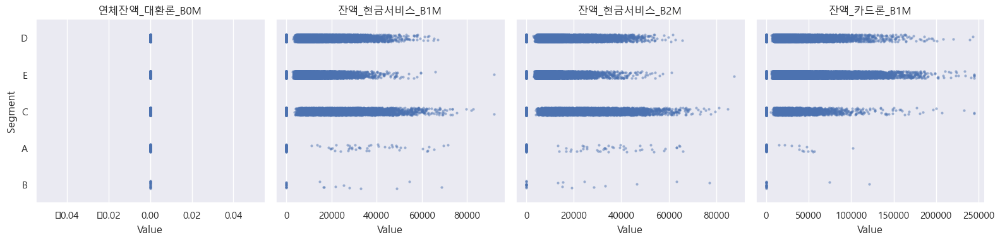

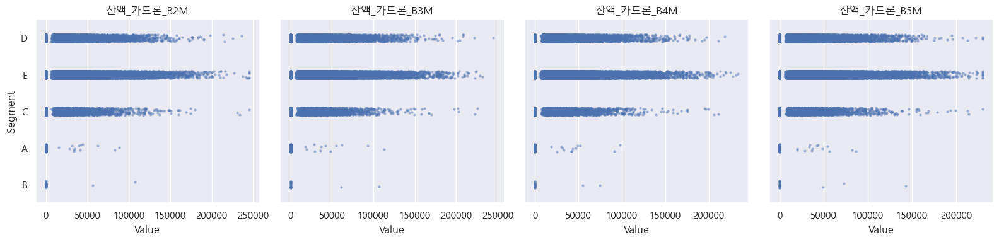

...

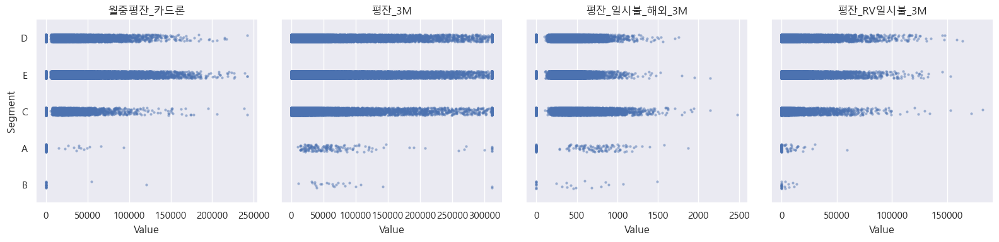

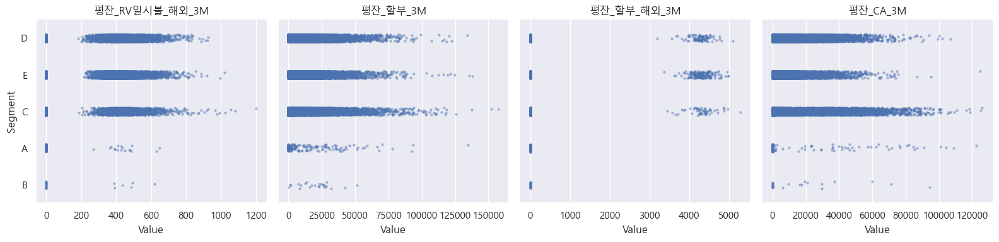

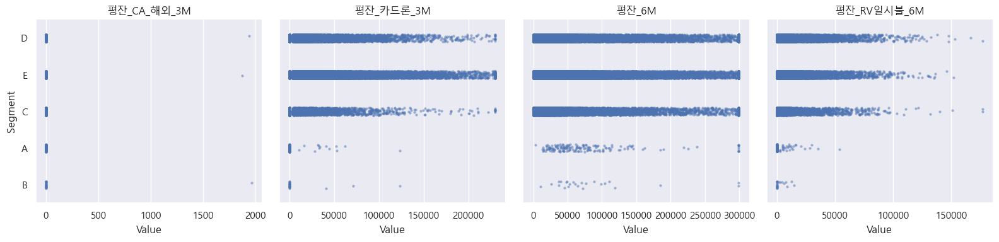

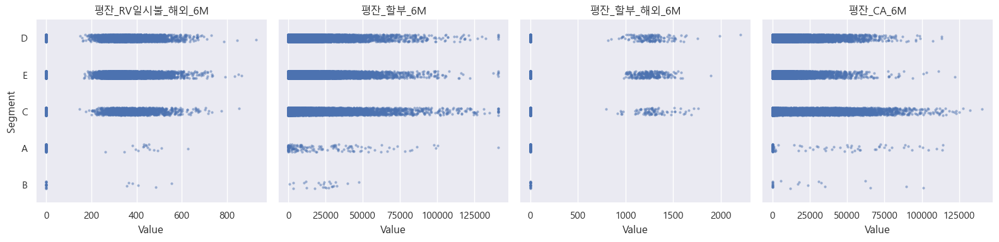

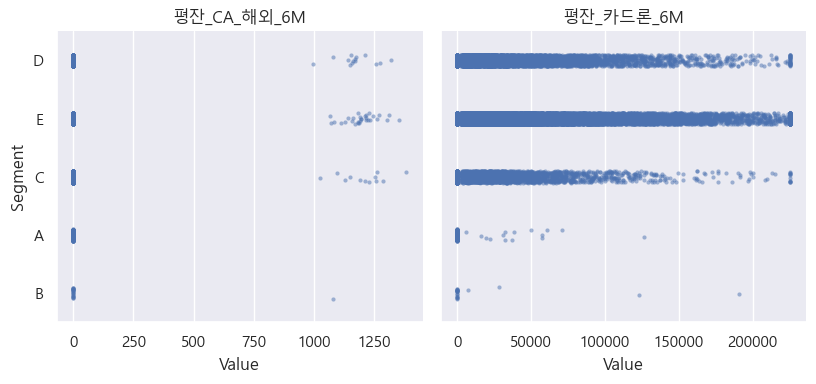

In [9]:
# 시각화할 컬럼 리스트
columns_to_plot = [
    "잔액_할부_B0M", "잔액_현금서비스_B0M", "잔액_리볼빙일시불이월_B0M", "잔액_리볼빙CA이월_B0M",
    "잔액_카드론_B0M", "월중평잔_할부_B0M", "월중평잔_CA_B0M", "연체잔액_B0M",
    "연체잔액_일시불_B0M", "연체잔액_할부_B0M", "연체잔액_현금서비스_B0M", "연체잔액_카드론_B0M",
    "연체잔액_대환론_B0M", "잔액_현금서비스_B1M", "잔액_현금서비스_B2M", "잔액_카드론_B1M",
    "잔액_카드론_B2M", "잔액_카드론_B3M", "잔액_카드론_B4M", "잔액_카드론_B5M",
    "잔액_할부_B1M", "잔액_할부_B2M", "연체원금_B1M", "연체원금_B2M", "연체원금_최근",
    "매각잔액_B1M", "RV_평균잔액_R12M", "RV_최대잔액_R12M", "RV_평균잔액_R6M",
    "RV_최대잔액_R6M", "RV_평균잔액_R3M", "RV_최대잔액_R3M",
    "잔액_할부_유이자_B0M", "잔액_할부_무이자_B0M", "잔액_할부_해외_B0M",
    "연체잔액_RV일시불_B0M", "연체잔액_CA_B0M", "월중평잔", "월중평잔_RV일시불",
    "월중평잔_CA", "월중평잔_카드론", "평잔_3M", "평잔_일시불_해외_3M", "평잔_RV일시불_3M",
    "평잔_RV일시불_해외_3M", "평잔_할부_3M", "평잔_할부_해외_3M", "평잔_CA_3M",
    "평잔_CA_해외_3M", "평잔_카드론_3M", "평잔_6M", "평잔_RV일시불_6M", "평잔_RV일시불_해외_6M",
    "평잔_할부_6M", "평잔_할부_해외_6M", "평잔_CA_6M", "평잔_CA_해외_6M", "평잔_카드론_6M"
]

plot_segment_scatter_grid(subset, columns_to_plot, max_cols=4)

In [31]:
columns_p = [
    "평잔_카드론_6M", "평잔_CA_해외_6M", "평잔_CA_해외_3M", "연체잔액_현금서비스_B0M",
    "평잔_할부_해외_6M", "평잔_할부_해외_3M", "평잔_일시불_해외_3M", "연체잔액_일시불_B0M"
]

In [33]:
def calculate_cv(series):
    mean = series.mean()
    std = series.std()
    if mean == 0:
        return float('nan')  # 평균이 0이면 CV 계산 불가
    return std / mean


In [35]:
def calculate_cv_by_segment(df, columns, segment_col="Segment"):
    cv_table = {}

    for col in columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            grouped = df.groupby(segment_col)[col].apply(calculate_cv)
            cv_table[col] = grouped

    return pd.DataFrame(cv_table).T  # 행: 변수, 열: 세그먼트별 CV


In [37]:
cv_df = calculate_cv_by_segment(subset, columns_p)
cv_df

Segment,A,B,C,D,E
평잔_카드론_6M,3.792376,3.114854,3.852466,4.071733,5.552082
평잔_CA_해외_6M,NaN,4.898979,42.205953,64.612191,103.486644
평잔_CA_해외_3M,NaN,4.898979,NaN,241.261269,565.987632
연체잔액_현금서비스_B0M,NaN,NaN,NaN,241.261269,256.644009
평잔_할부_해외_6M,NaN,NaN,15.665043,19.117590,35.420413
평잔_할부_해외_3M,NaN,NaN,19.345247,24.028390,41.331758
평잔_일시불_해외_3M,0.888463,1.102635,1.567436,1.944763,3.762427
연체잔액_일시불_B0M,NaN,NaN,41.334519,47.660177,58.459492


In [39]:
def select_features_by_cv(cv_df, threshold=3.0, min_valid_segments=3):
    """
    변동계수 데이터프레임(cv_df)에서 유효한 피처만 필터링합니다.
    
    Parameters:
    - cv_df: 행=변수명, 열=Segment별 CV
    - threshold: CV 최대 허용값 (기본=3.0)
    - min_valid_segments: 허용 기준을 만족하는 Segment 수 (기본=3개 이상)
    
    Returns:
    - List of usable feature names
    """
    usable = (cv_df < threshold)  # threshold 미만인 항목은 True
    valid_feature_mask = usable.sum(axis=1) >= min_valid_segments
    return cv_df[valid_feature_mask].index.tolist()


In [41]:
selected_features = select_features_by_cv(cv_df, threshold=3.0, min_valid_segments=3)
print("선정된 피처 목록:")
for col in selected_features:
    print("-", col)


선정된 피처 목록:
- 평잔_일시불_해외_3M


In [43]:
col = '평잔_일시불_해외_3M'

# 'Segment'가 E인 행들 중에서, 해당 칼럼의 값만 뽑음
segment_e_values = subset[subset['Segment'] == 'E'][col].dropna()

# 평균과 표준편차 계산
mean_val = segment_e_values.mean()
std_val = segment_e_values.std()
cv = std_val / mean_val

# 결과 출력
print(f"Segment E의 '{col}' 값들")
print(f" → 평균: {mean_val:.2f}")
print(f" → 표준편차: {std_val:.2f}")
print(f" → 변동계수 (CV): {cv:.2f}")

if cv < 0.5:
    print("✅ 평균에 집중 → 피처로 사용 적합")
else:
    print("⚠️ 평균에서 많이 퍼져 있음 → 신중히 고려")

Segment E의 '평잔_일시불_해외_3M' 값들
 → 평균: 25.19
 → 표준편차: 94.79
 → 변동계수 (CV): 3.76
⚠️ 평균에서 많이 퍼져 있음 → 신중히 고려


In [47]:
cols = [
    "평잔_카드론_6M", "평잔_CA_해외_6M", "평잔_CA_해외_3M", "연체잔액_현금서비스_B0M",
    "평잔_할부_해외_6M", "평잔_할부_해외_3M", "평잔_일시불_해외_3M", "연체잔액_일시불_B0M"
]

segment_targets = ['C', 'D', 'E']

# 결과 저장
cv_results = {}

for col in cols:
    cv_results[col] = {}
    for seg in segment_targets:
        seg_data = train_df[train_df['Segment'] == seg][col].dropna()
        mean = seg_data.mean()
        std = seg_data.std()
        cv = std / mean if mean != 0 else float('inf')
        cv_results[col][seg] = round(cv, 3)

# 결과 보기
import pandas as pd
cv_df = pd.DataFrame(cv_results).T
cv_df.columns = ['CV_C', 'CV_D', 'CV_E']
cv_df['CV_Diff_D_vs_CE'] = cv_df['CV_D'] - ((cv_df['CV_C'] + cv_df['CV_E']) / 2)
cv_df

,CV_C,CV_D,CV_E,CV_Diff_D_vs_CE
평잔_카드론_6M,3.720,3.954,5.463,-0.6375
평잔_CA_해외_6M,34.396,51.092,82.208,-7.2100
평잔_CA_해외_3M,67.538,94.719,143.847,-10.9735
연체잔액_현금서비스_B0M,81.942,62.177,92.229,-24.9085
평잔_할부_해외_6M,15.373,19.828,36.389,-6.0530
평잔_할부_해외_3M,19.207,23.900,41.979,-6.6930
평잔_일시불_해외_3M,1.569,1.951,3.739,-0.7030
연체잔액_일시불_B0M,27.262,24.665,31.678,-4.8050


In [35]:
from sklearn.preprocessing import KBinsDiscretizer
from scipy.stats import chi2_contingency
import warnings
warnings.filterwarnings('ignore')


# Segment C/D/E만 사용
cde_df = train_df[train_df['Segment'].isin(['C', 'D', 'E'])].copy()
# cde_df = train_df[train_df['Segment'].isin(['A','B','C', 'D', 'E'])].copy()

# 수치형 컬럼 자동 추출
numeric_cols = cde_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'ID']  # ID 등 제외

# 결과 저장
results = []

for col in numeric_cols:
    try:
        # binning (5등분, quantile 기반)
        discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
        binned = discretizer.fit_transform(cde_df[[col]])
        cde_df['binned'] = binned

        # 교차표 생성
        contingency = pd.crosstab(cde_df['binned'], cde_df['Segment'])

        # 카이제곱 검정
        chi2, p, dof, expected = chi2_contingency(contingency)

        results.append({
            'Feature': col,
            'Chi2 Stat': chi2,
            'p-value': round(p, 10),
        })
    except:
        continue  # NaN 또는 에러나는 컬럼은 건너뜀

# 상위 10개 정렬 및 출력
result_df = pd.DataFrame(results)
top10 = result_df.sort_values(by='Chi2 Stat', ascending=False).head(10)
top10[['Feature', 'Chi2 Stat', 'p-value']]

,Feature,Chi2 Stat,p-value
70,평잔_6M,564414.696318,0.0
60,평잔_3M,557628.828843,0.0
54,월중평잔,550189.513449,0.0
7,월중평잔_일시불_B0M,521391.703076,0.0
71,평잔_일시불_6M,514769.412046,0.0
55,월중평잔_일시불,509172.112346,0.0
1,잔액_일시불_B0M,504710.144773,0.0
61,평잔_일시불_3M,502540.824237,0.0
26,잔액_일시불_B1M,456435.146051,0.0
27,잔액_일시불_B2M,451619.697514,0.0


In [37]:
from sklearn.preprocessing import KBinsDiscretizer, LabelEncoder
from scipy.stats import chi2_contingency
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Segment C/D/E만 사용
cde_df = train_df[train_df['Segment'].isin(['C', 'D', 'E'])].copy()

# Segment 인코딩 (상관계수 계산용)
le = LabelEncoder()
cde_df['Segment_encoded'] = le.fit_transform(cde_df['Segment'])  # C=0, D=1, E=2 등

# 수치형 컬럼 자동 추출
numeric_cols = cde_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_cols = [col for col in numeric_cols if col not in ['ID']]  # ID 제거

# ⬇️ 상관계수 계산 후 0.3 이하 필터링
correlations = cde_df[numeric_cols].corrwith(cde_df['Segment_encoded'])
low_corr_cols = correlations[correlations.abs() <= 0.3].index.tolist()

# 결과 저장
results = []

for col in low_corr_cols:
    try:
        # binning (5등분, quantile 기반)
        discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
        binned = discretizer.fit_transform(cde_df[[col]])
        cde_df['binned'] = binned

        # 교차표 생성
        contingency = pd.crosstab(cde_df['binned'], cde_df['Segment'])

        # 카이제곱 검정
        chi2, p, dof, expected = chi2_contingency(contingency)

        results.append({
            'Feature': col,
            'Correlation': round(correlations[col], 4),
            'Chi2 Stat': chi2,
            'p-value': round(p, 10),
        })
    except:
        continue  # NaN 또는 에러나는 컬럼은 건너뜀

# 결과 정리 및 출력
result_df = pd.DataFrame(results)
top10 = result_df.sort_values(by='Chi2 Stat', ascending=False).head(10)
top10[['Feature', 'Correlation', 'Chi2 Stat', 'p-value']]


,Feature,Correlation,Chi2 Stat,p-value
56,평잔_6M,-0.2778,564197.291286,0.0
47,평잔_3M,-0.2650,557789.951053,0.0
42,월중평잔,-0.2831,550087.264039,0.0
59,평잔_할부_6M,-0.2453,154568.389844,0.0
38,잔액_할부_무이자_B0M,-0.2431,119733.614773,0.0
6,월중평잔_할부_B0M,-0.2305,116703.547631,0.0
44,월중평잔_할부,-0.2278,115958.417703,0.0
51,평잔_할부_3M,-0.2285,115180.294823,0.0
21,잔액_할부_B1M,-0.2242,113871.724359,0.0
22,잔액_할부_B2M,-0.2241,113486.588674,0.0


In [27]:
import pandas as pd
from sklearn.feature_selection import f_classif, SelectKBest
from sklearn.preprocessing import LabelEncoder

# 사용할 피처
cols = [
    "평잔_카드론_6M", "평잔_CA_해외_6M", "평잔_CA_해외_3M", "연체잔액_현금서비스_B0M",
    "평잔_할부_해외_6M", "평잔_할부_해외_3M", "평잔_일시불_해외_3M", "연체잔액_일시불_B0M"
]

# X, y 설정
X = train_df[cols].copy()
y = train_df['Segment']

# 결측치 처리
X = X.fillna(0)

# 타겟 인코딩
le = LabelEncoder()
y = le.fit_transform(y)

# ANOVA (F-검정)
selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X, y)

# 결과 정리
anova_result = pd.DataFrame({
    'Feature': cols,
    'F-Value (ANOVA)': selector.scores_,
    'p-value': selector.pvalues_
}).sort_values(by='F-Value (ANOVA)', ascending=False).reset_index(drop=True)

# 결과 출력
anova_result

,Feature,F-Value (ANOVA),p-value
0,평잔_일시불_해외_3M,56938.348365,0.000000e+00
1,평잔_카드론_6M,1249.109012,0.000000e+00
2,평잔_할부_해외_6M,466.057762,0.000000e+00
3,평잔_CA_해외_3M,443.803970,0.000000e+00
4,평잔_할부_해외_3M,257.921559,5.413652e-222
5,평잔_CA_해외_6M,255.086627,1.548961e-219
6,연체잔액_일시불_B0M,39.662902,2.852372e-33
7,연체잔액_현금서비스_B0M,11.567772,2.163250e-09
